# Cluster Exploration — English NewLit (Phase 1 — SVD-LSA dim=300)

Визуализация и статистики финальных кластеров из задачи `eng-corpus-wishart`.

**Входные данные:**
- Embeddings: `v4-nopc1` — 79,485 × **300**, L2-normalized SVD-LSA (log-entropy, k=300) с удалённым PC1
- Large: `c11-large` — 18 кластеров (Bisecting K-Means)
- Medium: `c11-medium` — 100 кластеров
- Small: `c17-small` — 517 кластеров

**Phase 1 vs Phase 2**: оба ноутбука имеют одинаковую структуру и позволяют прямое визуальное сравнение. Phase 2 (CBOW dim=50) даёт в 1.5–2× лучшую равномерность кластеров и более чистую семантику. Figures и cache разделены по `figures/phase1/` и `cache/phase1/`.

**Структура ноутбука:**
1. Setup
2. Large (18) — статистики + визуализация
3. Medium (100)
4. Small (517) — подмножество Top-20 + Random-20
5. Cross-level hierarchy — связи между уровнями
6. Summary

Под каждым графиком — markdown ячейка для выводов пользователя.


## 0. Setup

In [1]:
# Imports
import json
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from scipy.cluster import hierarchy as sch
from scipy.spatial.distance import squareform
from sklearn.metrics import silhouette_samples

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Autoreload helpers
%load_ext autoreload
%autoreload 2

# Style
sns.set_theme(style="whitegrid", context="notebook")
mpl.rcParams["figure.dpi"] = 100
mpl.rcParams["savefig.dpi"] = 140
mpl.rcParams["savefig.bbox"] = "tight"
mpl.rcParams["font.size"] = 10

import helpers as H
print("Setup OK")


Setup OK


In [2]:
# Paths and constants
PHASE = 1
EMBEDDINGS_VERSION = "v4-nopc1"

EXP_DIR = Path(".").resolve()
WISHART_DIR = EXP_DIR.parent / "eng-corpus-wishart"
EMB_DIR = WISHART_DIR / "data" / "embeddings" / EMBEDDINGS_VERSION
CLUSTERS_DIR = WISHART_DIR / "data" / "clusters"
CACHE_DIR = EXP_DIR / "cache" / "phase1"
FIG_DIR = EXP_DIR / "figures" / "phase1"
CACHE_DIR.mkdir(parents=True, exist_ok=True)
FIG_DIR.mkdir(parents=True, exist_ok=True)

TOP_N = 20
RANDOM_N = 20
SILHOUETTE_SAMPLE_LARGE = 20_000
SILHOUETTE_SAMPLE_MEDIUM = 10_000
SILHOUETTE_SAMPLE_SMALL = 15_000
RNG_SEED = 42
rng = np.random.default_rng(RNG_SEED)

print(f"Phase: {PHASE}")
print(f"EMB_DIR: {EMB_DIR}")
print(f"CLUSTERS_DIR: {CLUSTERS_DIR}")
print(f"FIG_DIR: {FIG_DIR}")
print(f"CACHE_DIR: {CACHE_DIR}")


Phase: 1
EMB_DIR: /home/ppers/projects/create-complete-lang/claude-experements/eng-corpus-wishart/data/embeddings/v4-nopc1
CLUSTERS_DIR: /home/ppers/projects/create-complete-lang/claude-experements/eng-corpus-wishart/data/clusters
FIG_DIR: /home/ppers/projects/create-complete-lang/claude-experements/eng-corpus-cluster-explore/figures/phase1
CACHE_DIR: /home/ppers/projects/create-complete-lang/claude-experements/eng-corpus-cluster-explore/cache/phase1


In [3]:
# Load embeddings
vectors, idx2word, tf, df_arr = H.load_embeddings(EMB_DIR)
print(f"Vectors: shape={vectors.shape}, dtype={vectors.dtype}")
print(f"Vocab: {len(idx2word)} words")
print(f"TF range: [{tf.min()}, {tf.max()}]")
print(f"Norms: min={np.linalg.norm(vectors, axis=1).min():.4f}, "
      f"max={np.linalg.norm(vectors, axis=1).max():.4f} (should be ~1)")


Vectors: shape=(79485, 300), dtype=float32
Vocab: 79485 words
TF range: [5, 857884]


Norms: min=1.0000, max=1.0000 (should be ~1)


In [4]:
# Load all three cluster levels
LEVELS = {
    "large": H.load_level(CLUSTERS_DIR, "c11-large"),
    "medium": H.load_level(CLUSTERS_DIR, "c11-medium"),
    "small": H.load_level(CLUSTERS_DIR, "c17-small"),
}

for name, lvl in LEVELS.items():
    sizes = np.bincount(lvl["labels"][lvl["labels"] >= 0])
    print(f"{name:7s}: {lvl['n_clusters']:3d} clusters, "
          f"sizes [{sizes.min()}-{sizes.max()}], "
          f"mean={sizes.mean():.0f}")


large  :  18 clusters, sizes [1119-7839], mean=4416
medium : 100 clusters, sizes [223-1243], mean=795
small  : 517 clusters, sizes [95-347], mean=154


In [5]:
# Compute centroids for each level (used throughout the notebook)
CENTROIDS = {}
for name, lvl in LEVELS.items():
    c = H.compute_centroids(vectors, lvl["labels"])
    CENTROIDS[name] = c
    np.save(CACHE_DIR / f"centroids_{name}.npy", c)
    print(f"{name}: centroids shape {c.shape}")


large: centroids shape (18, 300)
medium: centroids shape (100, 300)
small: centroids shape (517, 300)


In [6]:
# Run UMAP once on the full 79k embedding — reuse for all levels
umap_cache = CACHE_DIR / "umap_coords.npy"
umap_coords, umap_reducer = H.run_umap(
    vectors,
    n_neighbors=30,
    min_dist=0.1,
    metric="cosine",
    random_state=42,
    cache_path=umap_cache,
)
print(f"UMAP coords: {umap_coords.shape}, "
      f"x range [{umap_coords[:,0].min():.2f}, {umap_coords[:,0].max():.2f}]")


[umap] fitting UMAP (n=79485, d=300, nn=30) ...


[umap] cached to /home/ppers/projects/create-complete-lang/claude-experements/eng-corpus-cluster-explore/cache/phase1/umap_coords.npy
UMAP coords: (79485, 2), x range [1.54, 14.87]


In [7]:
# Project centroids to UMAP space (for overlay on scatter plots)
CENTROIDS_2D = {}
for name, c in CENTROIDS.items():
    CENTROIDS_2D[name] = umap_reducer.transform(c)
    print(f"{name}: centroids 2D shape {CENTROIDS_2D[name].shape}")


large: centroids 2D shape (18, 2)
medium: centroids 2D shape (100, 2)


small: centroids 2D shape (517, 2)


In [8]:
# Compute anchor words for each cluster in each level (used in labels)
ANCHORS = {}
for name, lvl in LEVELS.items():
    ANCHORS[name] = H.anchor_words(vectors, lvl["labels"], CENTROIDS[name], idx2word, top_k=5)
print("Anchors computed for all levels.")
print("Example (large, cluster 0):", ANCHORS["large"][0])


Anchors computed for all levels.
Example (large, cluster 0): ['min', 'turnt', 'cep', 'wuss', 'wa']


In [9]:
QUALITY = {}

## 1. Large — 18 кластеров

### 1.1 Статистики и метрики качества

In [10]:
# Per-cluster basic stats
level = LEVELS["large"]
labels = level["labels"]
densities = level["densities"]
centroids = CENTROIDS["large"]
n_clusters_large = level["n_clusters"]

sizes_large = np.bincount(labels[labels >= 0])
per_cluster_large = H.compute_per_cluster_stats(vectors, labels, centroids, densities)
print(f"{n_clusters_large} clusters computed; columns: {list(per_cluster_large.columns)}")
per_cluster_large.describe()


18 clusters computed; columns: ['size', 'inertia', 'mean_dist', 'median_dist', 'max_dist', 'std_dist', 'mean_density', 'median_density']


,size,inertia,mean_dist,median_dist,max_dist,std_dist,mean_density,median_density
count,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000
mean,4415.833333,6250.033346,1.160122,1.181328,1.372256,0.115881,0.935713,0.941981
std,2231.182178,3634.824880,0.145760,0.149967,0.084124,0.057970,0.075742,0.082003
min,1119.000000,1173.548462,0.701782,0.672018,1.162285,0.042254,0.667575,0.635748
25%,2367.000000,2929.271362,1.081591,1.115665,1.316551,0.077905,0.910930,0.925426
50%,4608.500000,5874.558594,1.200675,1.228954,1.384364,0.100915,0.961131,0.969936
75%,6301.000000,9491.672852,1.258438,1.272785,1.439323,0.136046,0.978473,0.981896
max,7839.000000,11736.716797,1.308767,1.306712,1.492898,0.279924,0.989738,0.989254


In [11]:
# Distribution summary
dist_large = H.distribution_summary(sizes_large)
print(json.dumps(dist_large, indent=2, default=float))


{
  "n_clusters": 18,
  "min": 1119,
  "max": 7839,
  "mean": 4415.833333333333,
  "median": 4608.5,
  "std": 2168.319324833048,
  "cv": 0.49103287220223774,
  "max_min_ratio": 7.005361930294906,
  "gini": 0.28000880669308675,
  "entropy": 2.760807398479767,
  "entropy_norm": 0.9551738079842351,
  "outlier_frac_2sigma": 0.0
}


In [12]:
# Quality metrics: silhouette (stratified), Davies-Bouldin, Calinski-Harabasz, Dunn
sil_cache = CACHE_DIR / "silhouette_large.npz"
if sil_cache.exists():
    cached = np.load(sil_cache)
    sil_mean_large = float(cached["mean"])
    sil_scores_large = cached["scores"]
    sil_idx_large = cached["indices"]
    print(f"Silhouette loaded from cache: mean={sil_mean_large:.4f}")
else:
    sil_mean_large, sil_scores_large, sil_idx_large = H.silhouette_sampled(
        vectors, labels,
        sample_size=SILHOUETTE_SAMPLE_LARGE,
        min_per_cluster=20,
        metric="cosine",
        rng=np.random.default_rng(RNG_SEED),
    )
    np.savez(sil_cache, mean=sil_mean_large, scores=sil_scores_large, indices=sil_idx_large)
    print(f"Silhouette computed: mean={sil_mean_large:.4f} (stratified sample n={len(sil_idx_large)})")

db_large = H.davies_bouldin_full(vectors, labels)
ch_large = H.calinski_harabasz_full(vectors, labels)
max_radii_large = per_cluster_large["max_dist"].values
dunn_large = H.dunn_index_centroid(centroids, max_radii_large, metric="cosine")

# Store globally
QUALITY.setdefault("all", {})
QUALITY["large"] = {
    "silhouette": sil_mean_large,
    "davies_bouldin": db_large,
    "calinski_harabasz": ch_large,
    "dunn": dunn_large,
}

print(f"Silhouette: {sil_mean_large:.4f}")
print(f"Davies-Bouldin: {db_large:.4f} (lower = better)")
print(f"Calinski-Harabasz: {ch_large:.1f} (higher = better)")
print(f"Dunn (centroid-based): {dunn_large:.4f} (higher = better)")


Silhouette computed: mean=0.0542 (stratified sample n=19999)
Silhouette: 0.0542
Davies-Bouldin: 7.4137 (lower = better)
Calinski-Harabasz: 544.9 (higher = better)
Dunn (centroid-based): 0.1257 (higher = better)


In [13]:
# Per-cluster silhouette (from stratified sample)
sample_labels_large = labels[sil_idx_large]
per_cluster_sil_large = H.silhouette_per_cluster(sil_scores_large, sample_labels_large)

# Add silhouette + anchors + mean_density (already in per_cluster) to summary table
summary_large = per_cluster_large.copy()
summary_large["silhouette"] = [per_cluster_sil_large.get(cid, np.nan) for cid in summary_large.index]
summary_large["anchors"] = [", ".join(ANCHORS["large"].get(cid, [])[:3]) for cid in summary_large.index]
summary_large = summary_large.sort_values("size", ascending=False)
summary_large.head(20)


,size,inertia,mean_dist,median_dist,max_dist,std_dist,mean_density,median_density,silhouette,anchors
cluster_id,,,,,,,,,,
3,7839,11168.878906,1.188286,1.215766,1.397156,0.112964,0.956961,0.965719,0.006946,"essentially, fundamental, essential"
6,7367,11736.716797,1.259911,1.274694,1.451182,0.075972,0.978898,0.982378,-0.010597,"onto, shack, cattleman"
10,6877,9831.789062,1.189394,1.222920,1.381309,0.122492,0.957583,0.968227,0.029760,"contemporary, critic, criticism"
11,6621,11352.743164,1.308767,1.306712,1.492898,0.042254,0.989738,0.989254,-0.020505,"confidence, unselfish, situation"
17,6307,9350.470703,1.214090,1.234988,1.414683,0.092416,0.965505,0.971645,0.011573,"peel, bunche, grease"
0,6283,7201.605957,1.057159,1.092788,1.306711,0.169173,0.900545,0.915555,0.153068,"min, turnt, cep"
7,5948,9538.740234,1.264181,1.279677,1.432202,0.074400,0.979996,0.983590,-0.001955,"agreeable, polite, tete"
12,5264,8582.912109,1.273959,1.292628,1.457335,0.086729,0.982579,0.986574,-0.021655,"unwilling, prudent, prudence"
1,5037,2875.397461,0.701782,0.672018,1.162285,0.279924,0.667575,0.635748,0.476592,"gan, wight, helpe"


### 1.2 Распределение размеров кластеров

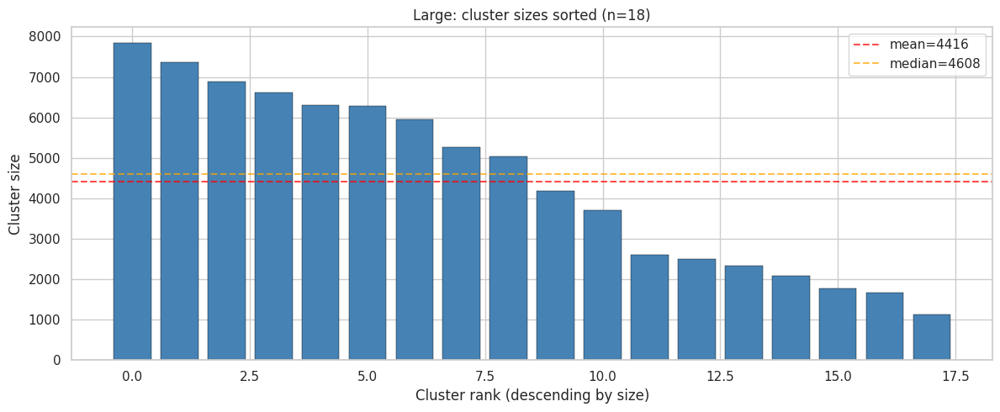

In [14]:
# Plot: sorted bar chart of cluster sizes
fig, ax = plt.subplots(figsize=(12, 5))
sorted_sizes = np.sort(sizes_large)[::-1]
ax.bar(range(len(sorted_sizes)), sorted_sizes, color="steelblue", edgecolor="black", linewidth=0.3)
ax.axhline(sorted_sizes.mean(), color="red", linestyle="--", alpha=0.7, label=f"mean={sorted_sizes.mean():.0f}")
ax.axhline(np.median(sorted_sizes), color="orange", linestyle="--", alpha=0.7, label=f"median={np.median(sorted_sizes):.0f}")
ax.set_xlabel("Cluster rank (descending by size)")
ax.set_ylabel("Cluster size")
ax.set_title(f"Large: cluster sizes sorted (n={len(sorted_sizes)})")
ax.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "large_01_sizes_sorted.png")
plt.show()


> *Plot L1 — описание*: распределение размеров кластеров, отсортированных по убыванию.

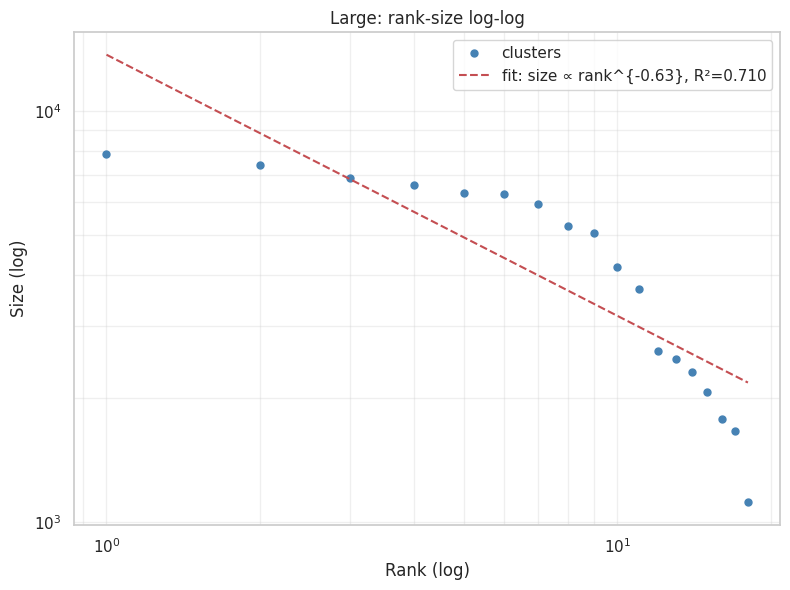

In [15]:
# Plot: rank-size log-log with power law fit
from scipy.stats import linregress
fig, ax = plt.subplots(figsize=(8, 6))
ranks = np.arange(1, len(sizes_large) + 1)
sorted_sizes_desc = np.sort(sizes_large)[::-1]
ax.loglog(ranks, sorted_sizes_desc, "o", markersize=5, color="steelblue", label="clusters")

# Power law fit: log(size) = a * log(rank) + b
log_rank = np.log(ranks)
log_size = np.log(sorted_sizes_desc)
slope, intercept, r_value, _, _ = linregress(log_rank, log_size)
fit_y = np.exp(intercept + slope * log_rank)
ax.loglog(ranks, fit_y, "r--", label=f"fit: size ∝ rank^{{{slope:.2f}}}, R²={r_value**2:.3f}")

ax.set_xlabel("Rank (log)")
ax.set_ylabel("Size (log)")
ax.set_title(f"Large: rank-size log-log")
ax.legend()
ax.grid(True, which="both", alpha=0.3)
plt.tight_layout()
plt.savefig(FIG_DIR / "large_02_rank_size_loglog.png")
plt.show()


> *Plot L2*: log-log rank-size — наклон ~-1 соответствует Zipf.

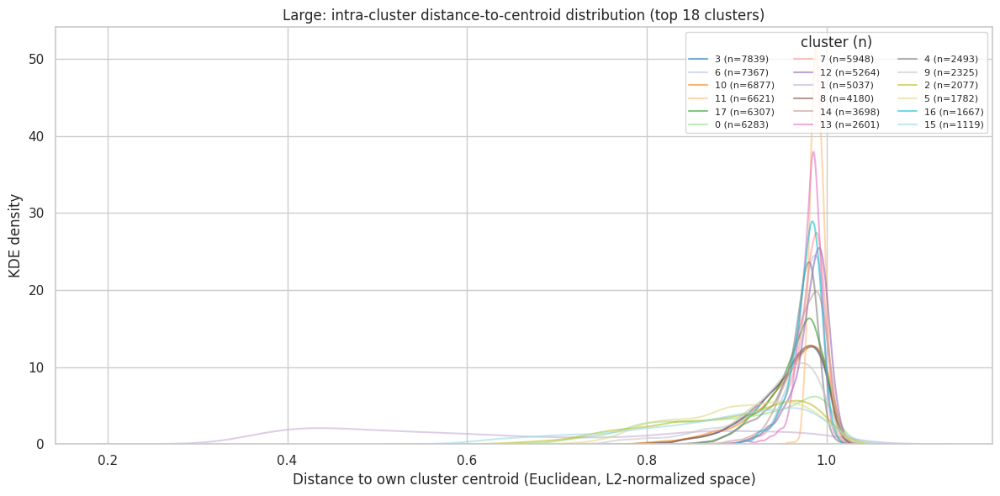

In [16]:
# Plot: per-cluster KDE of distances from each point to its cluster centroid
# NOTE: field `densities` in labels.npz actually stores distance-to-own-centroid
# (Euclidean on L2-normalized vectors). Not probability density.
fig, ax = plt.subplots(figsize=(12, 6))

# For large (18): all clusters; for medium/small: limit to top N for clarity
max_show = min(20, n_clusters_large)
top_cids = np.argsort(-sizes_large)[:max_show]
cmap = plt.cm.tab20(np.linspace(0, 1, max_show))

for i, cid in enumerate(top_cids):
    mask = labels == cid
    sns.kdeplot(densities[mask], ax=ax, color=cmap[i], alpha=0.6, linewidth=1.5,
                label=f"{cid} (n={mask.sum()})" if max_show <= 18 else None)

ax.set_xlabel("Distance to own cluster centroid (Euclidean, L2-normalized space)")
ax.set_ylabel("KDE density")
ax.set_title(f"Large: intra-cluster distance-to-centroid distribution (top {max_show} clusters)", fontsize=12)
if max_show <= 18:
    ax.legend(ncol=3, fontsize=8, loc="upper right", title="cluster (n)")
plt.tight_layout()
plt.savefig(FIG_DIR / "large_03_intra_dist_kde.png")
plt.show()


> *Plot L3*: KDE расстояний от каждой точки до **её собственного центроида**. Узкий пик слева = компактный кластер; широкий/смещённый вправо = рыхлый.

/tmp/ipykernel_813753/311666965.py:26: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(box_data, labels=box_labels, patch_artist=True, showfliers=False)


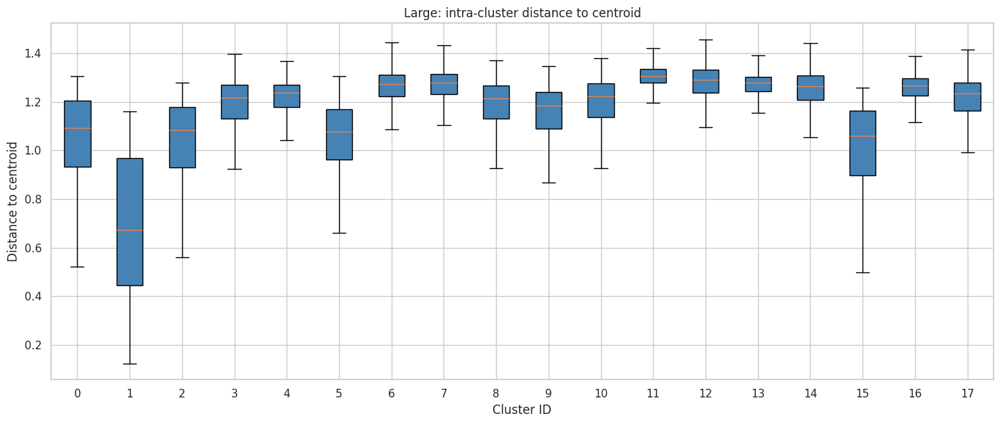

In [17]:
# Plot: boxplot of intra-cluster distance to centroid
fig, ax = plt.subplots(figsize=(14, 6))

# For small: only show selection
if "large" == "small":
    show_cids = SEL_SMALL["combined"]
    sel_groups = SEL_SMALL["group"]
else:
    show_cids = list(range(n_clusters_large))
    sel_groups = None

box_data = []
box_labels = []
box_colors = []
for i, cid in enumerate(show_cids):
    mask = labels == cid
    if mask.any():
        dists = np.linalg.norm(vectors[mask] - centroids[cid], axis=1)
        box_data.append(dists)
        box_labels.append(str(cid))
        if sel_groups is not None:
            box_colors.append("steelblue" if sel_groups[i] == "top" else "coral")
        else:
            box_colors.append("steelblue")

bp = ax.boxplot(box_data, labels=box_labels, patch_artist=True, showfliers=False)
for patch, color in zip(bp["boxes"], box_colors):
    patch.set_facecolor(color)

ax.set_xlabel("Cluster ID")
ax.set_ylabel("Distance to centroid")
ax.set_title(f"Large: intra-cluster distance to centroid")
if sel_groups is not None:
    from matplotlib.patches import Patch
    ax.legend(handles=[Patch(color="steelblue", label="Top-20"), Patch(color="coral", label="Random-20")])
if len(show_cids) > 30:
    plt.xticks(rotation=90, fontsize=7)
plt.tight_layout()
plt.savefig(FIG_DIR / "large_04_intra_dist_boxplot.png")
plt.show()


> *Plot L4*: компактность кластеров — распределение расстояний точек до центроида.

### 1.3 Качество кластеризации

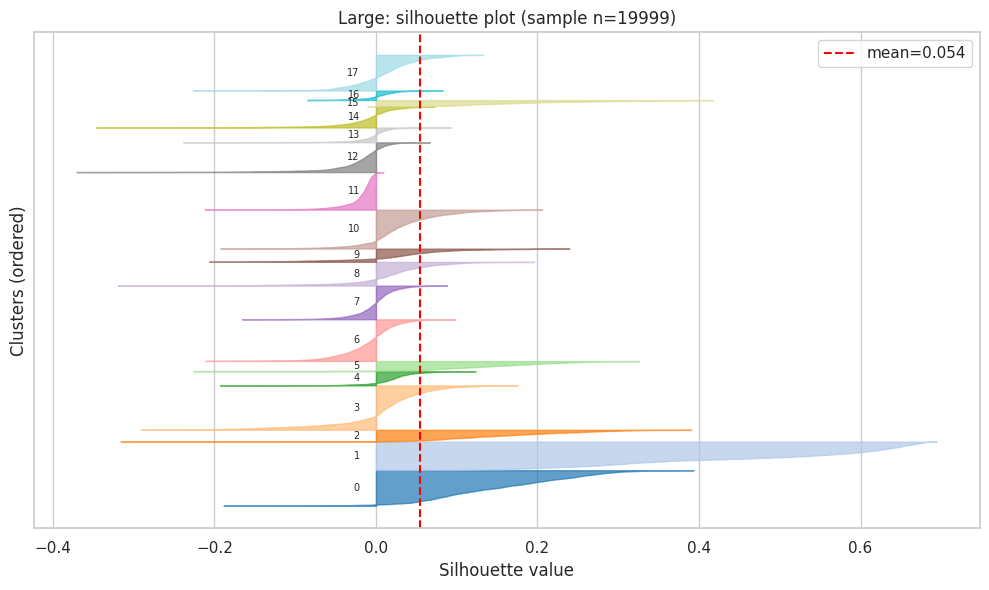

In [18]:
# Silhouette plot (horizontal bars per point, grouped by cluster)
fig, ax = plt.subplots(figsize=(10, max(6, n_clusters_large * 0.15)))

# For small, limit to selection for readability
if "large" == "small":
    sel_cids = SEL_SMALL["combined"]
    mask_sel = np.isin(sample_labels_large, sel_cids)
    ss = sil_scores_large[mask_sel]
    sl = sample_labels_large[mask_sel]
    show_cids = sel_cids
    ax.set_title(f"Large: silhouette plot (selection: Top-20 + Random-20, sample={mask_sel.sum()})")
else:
    ss = sil_scores_large
    sl = sample_labels_large
    show_cids = list(range(n_clusters_large))
    ax.set_title(f"Large: silhouette plot (sample n={len(ss)})")

y_lower = 0
cmap = plt.cm.tab20(np.linspace(0, 1, len(show_cids)))
for i, cid in enumerate(show_cids):
    cluster_ss = np.sort(ss[sl == cid])
    if len(cluster_ss) == 0:
        continue
    y_upper = y_lower + len(cluster_ss)
    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_ss,
                     facecolor=cmap[i], edgecolor=cmap[i], alpha=0.7)
    ax.text(-0.02, y_lower + len(cluster_ss) / 2, str(cid), fontsize=7, ha="right", va="center")
    y_lower = y_upper + 5

ax.axvline(sil_mean_large, color="red", linestyle="--", label=f"mean={sil_mean_large:.3f}")
ax.set_xlabel("Silhouette value")
ax.set_ylabel("Clusters (ordered)")
ax.legend()
ax.set_yticks([])
plt.tight_layout()
plt.savefig(FIG_DIR / "large_05_silhouette_plot.png")
plt.show()


> *Plot L5*: классический silhouette plot — ширина полосы = silhouette score каждой точки.

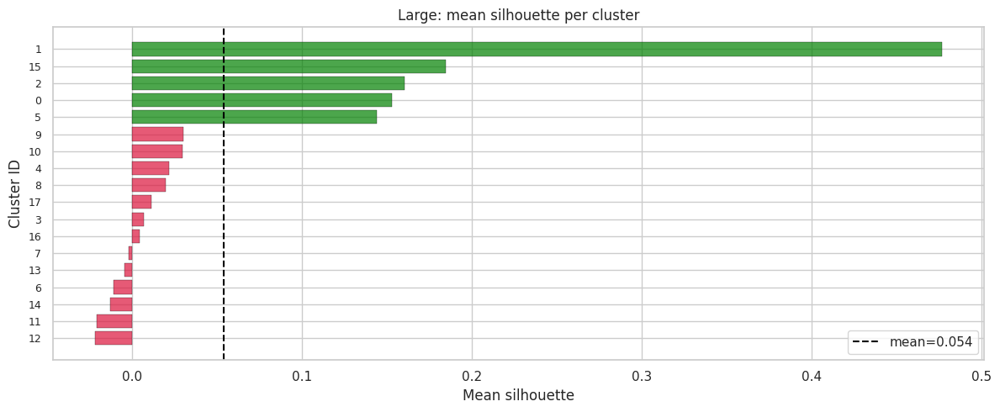

In [19]:
# Bar chart: mean silhouette per cluster
fig, ax = plt.subplots(figsize=(12, max(5, n_clusters_large * 0.08)))

cids = sorted(per_cluster_sil_large.keys())
vals = [per_cluster_sil_large[c] for c in cids]
order = np.argsort(vals)
cids_sorted = [cids[i] for i in order]
vals_sorted = [vals[i] for i in order]

colors = ["green" if v > sil_mean_large else "crimson" for v in vals_sorted]
ax.barh(range(len(cids_sorted)), vals_sorted, color=colors, alpha=0.7, edgecolor="black", linewidth=0.3)
ax.axvline(sil_mean_large, color="black", linestyle="--", label=f"mean={sil_mean_large:.3f}")
ax.set_yticks(range(len(cids_sorted)))
ax.set_yticklabels(cids_sorted, fontsize=7 if n_clusters_large > 50 else 9)
ax.set_xlabel("Mean silhouette")
ax.set_ylabel("Cluster ID")
ax.set_title(f"Large: mean silhouette per cluster")
ax.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "large_06_silhouette_per_cluster.png")
plt.show()


> *Plot L6*: средний silhouette каждого кластера. Красные — ниже среднего.

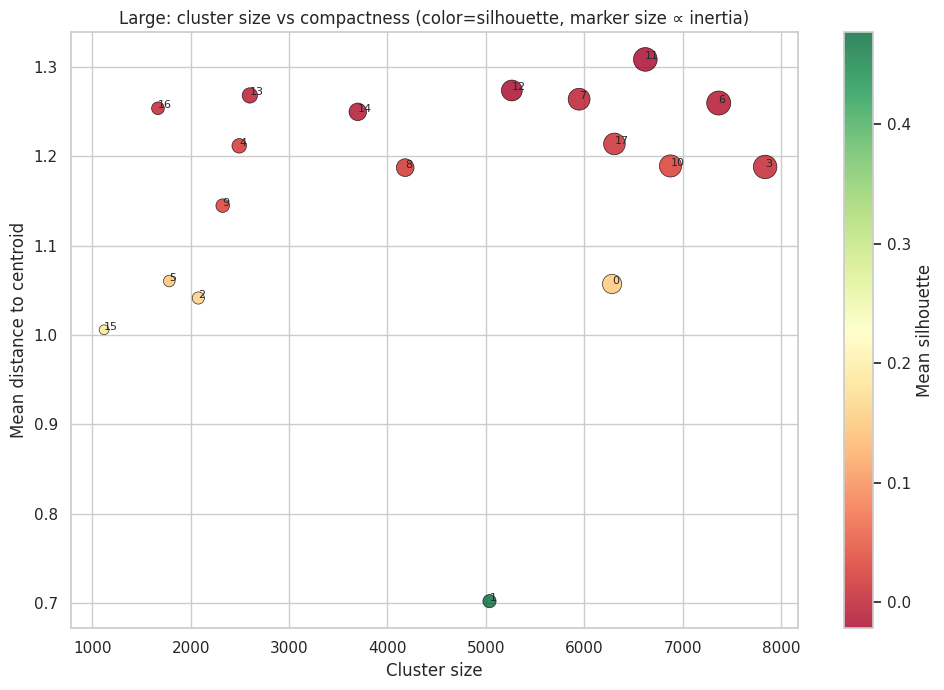

In [20]:
# Scatter: size vs mean intra-distance, color=silhouette, marker size ∝ inertia
fig, ax = plt.subplots(figsize=(10, 7))
df_plot = summary_large.copy()
sizes_s = df_plot["size"].values
mean_dists = df_plot["mean_dist"].values
sils = df_plot["silhouette"].values
inertias = df_plot["inertia"].values

marker_sizes = 50 + 250 * (inertias - inertias.min()) / (inertias.max() - inertias.min() + 1e-9)
sc = ax.scatter(sizes_s, mean_dists, c=sils, s=marker_sizes,
                cmap="RdYlGn", alpha=0.8, edgecolor="black", linewidth=0.5)
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Mean silhouette")
ax.set_xlabel("Cluster size")
ax.set_ylabel("Mean distance to centroid")
ax.set_title(f"Large: cluster size vs compactness (color=silhouette, marker size ∝ inertia)")
if "large" == "large":
    for cid, row in df_plot.iterrows():
        ax.annotate(str(cid), (row["size"], row["mean_dist"]), fontsize=8)
plt.tight_layout()
plt.savefig(FIG_DIR / "large_07_size_vs_compactness.png")
plt.show()


> *Plot L7*: зависимость компактности от размера кластера.

### 1.4 Межкластерная структура

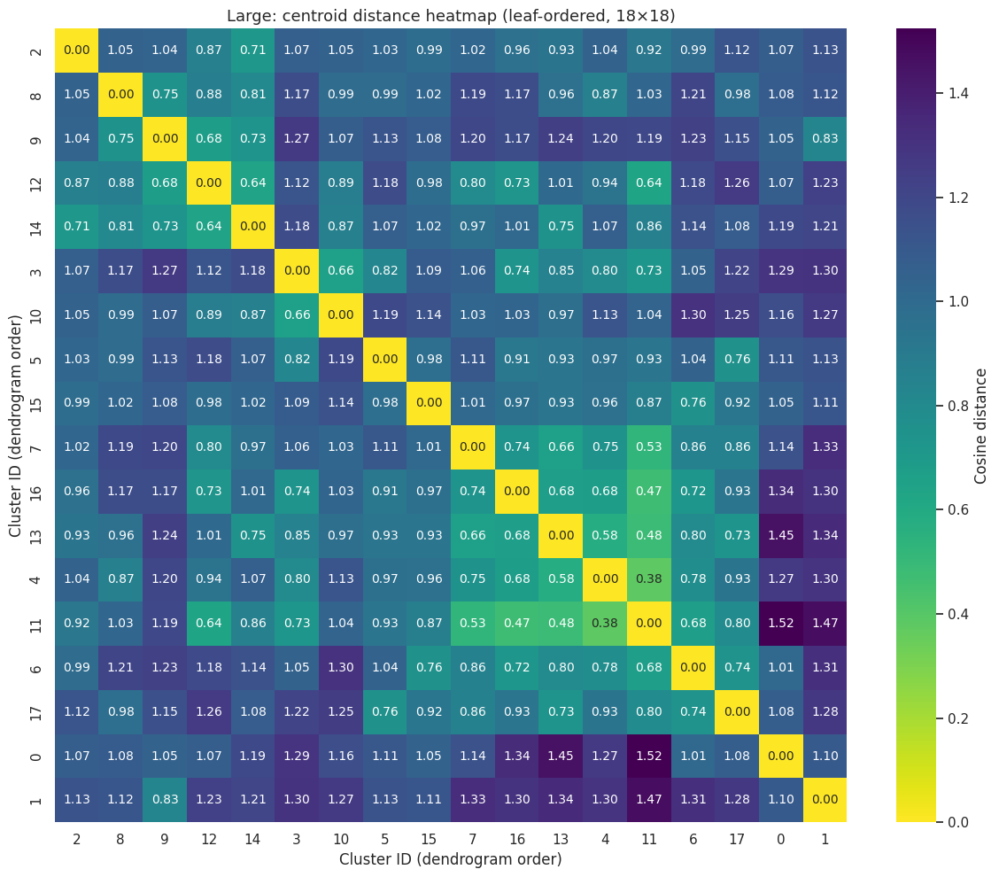

In [21]:
# Heatmap of centroid cosine distances, ordered by hierarchical clustering
dist_mat = H.centroid_distance_matrix(centroids, metric="cosine")
Z = sch.linkage(squareform(dist_mat, checks=False), method="average")
leaves = sch.leaves_list(Z)
dist_mat_ord = dist_mat[leaves][:, leaves]

fig, ax = plt.subplots(figsize=(max(12, min(n_clusters_large * 0.12, 16)), max(10, min(n_clusters_large * 0.11, 14))))
sns.heatmap(dist_mat_ord,
            annot=(n_clusters_large <= 20),
            fmt=".2f",
            cmap="viridis_r",
            xticklabels=leaves if n_clusters_large <= 100 else False,
            yticklabels=leaves if n_clusters_large <= 100 else False,
            ax=ax, cbar_kws={"label": "Cosine distance"})
ax.set_title(f"Large: centroid distance heatmap (leaf-ordered, {n_clusters_large}×{n_clusters_large})", fontsize=13)
ax.set_xlabel("Cluster ID (dendrogram order)")
ax.set_ylabel("Cluster ID (dendrogram order)")
plt.tight_layout()
plt.savefig(FIG_DIR / "large_08_centroid_heatmap.png")
plt.show()


> *Plot L8*: матрица косинусных расстояний между центроидами.

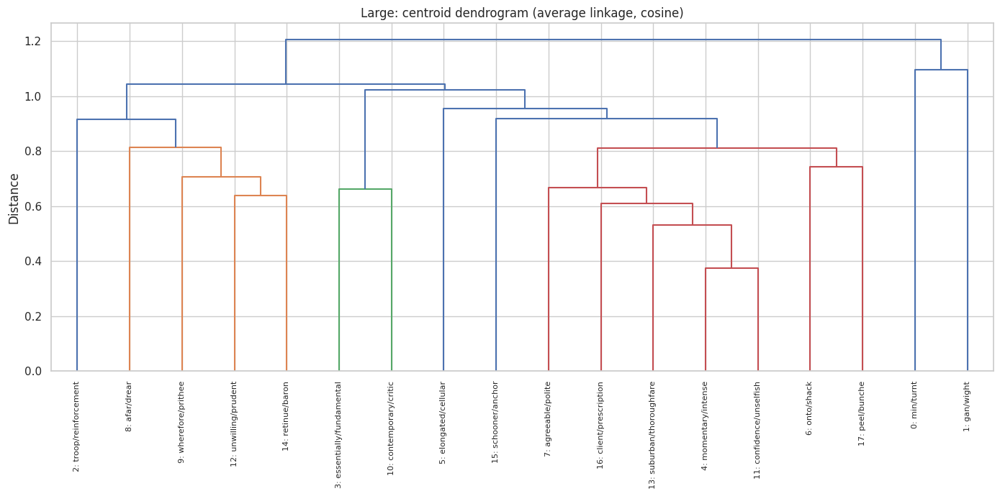

In [22]:
# Dendrogram of centroids
fig, ax = plt.subplots(figsize=(max(14, n_clusters_large * 0.15), 7))
labels_dendro = [f"{cid}: {'/'.join(ANCHORS['large'].get(cid, [])[:2])}" for cid in range(n_clusters_large)]

# For small, truncate
if n_clusters_large > 100:
    sch.dendrogram(Z, ax=ax, truncate_mode="lastp", p=50, leaf_font_size=8,
                   show_contracted=True)
    ax.set_title(f"Large: centroid dendrogram (truncated to 50 leaves)")
else:
    sch.dendrogram(Z, ax=ax, labels=labels_dendro, leaf_font_size=8 if n_clusters_large <= 20 else 6,
                   leaf_rotation=90)
    ax.set_title(f"Large: centroid dendrogram (average linkage, cosine)")

ax.set_ylabel("Distance")
plt.tight_layout()
plt.savefig(FIG_DIR / "large_09_dendrogram.png")
plt.show()


> *Plot L9*: иерархия кластеров (average linkage) с anchor-словами в листах.

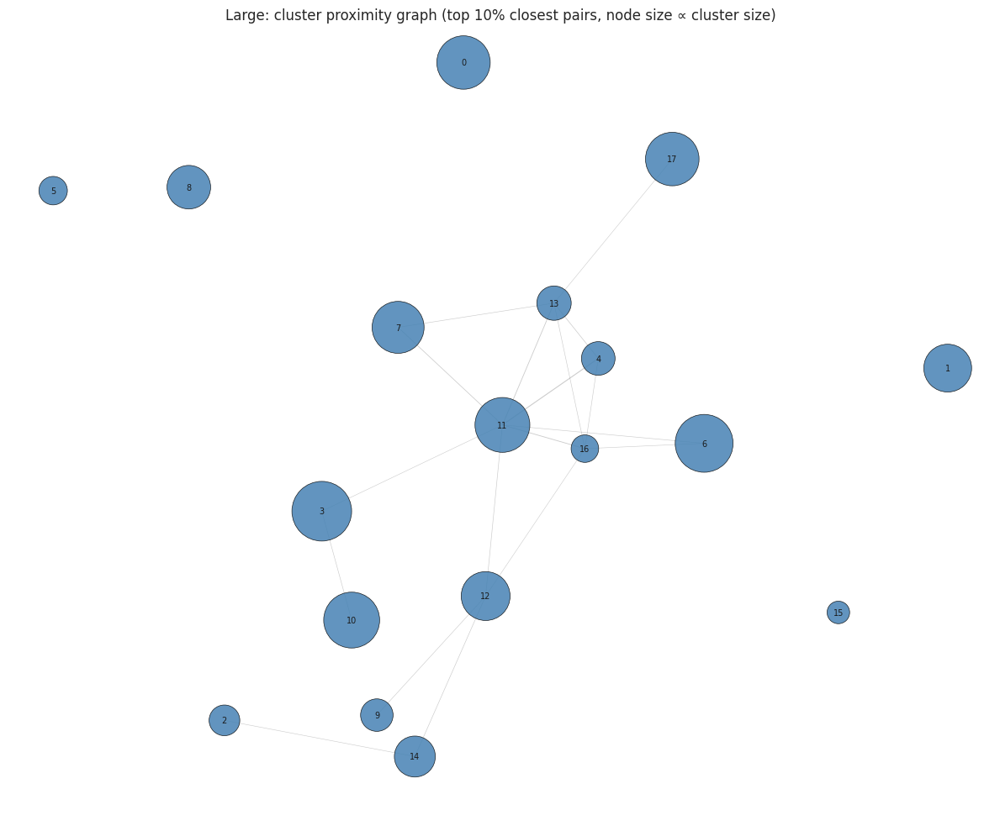

In [23]:
# Force-directed graph of closest centroid pairs
import networkx as nx
n_edges_show = int(n_clusters_large * (n_clusters_large - 1) / 2 * 0.10)  # top 10%
mask_tri = np.triu(np.ones_like(dist_mat, dtype=bool), k=1)
pairs = [(i, j, dist_mat[i, j]) for i, j in zip(*np.where(mask_tri))]
pairs.sort(key=lambda x: x[2])
top_pairs = pairs[:max(n_edges_show, n_clusters_large)]

G = nx.Graph()
for i in range(n_clusters_large):
    G.add_node(i, size=int(sizes_large[i]))
for i, j, d in top_pairs:
    G.add_edge(int(i), int(j), weight=1.0 / (d + 1e-6))

pos = nx.spring_layout(G, seed=42, k=0.8)
fig, ax = plt.subplots(figsize=(12, 10))
node_sizes = [G.nodes[n]["size"] / 3 for n in G.nodes]
edge_widths = [G.edges[e]["weight"] * 0.3 for e in G.edges]
nx.draw_networkx_edges(G, pos, ax=ax, width=edge_widths, alpha=0.4, edge_color="gray")
nx.draw_networkx_nodes(G, pos, ax=ax, node_size=node_sizes, node_color="steelblue",
                        edgecolors="black", linewidths=0.5, alpha=0.85)
if n_clusters_large <= 100:
    nx.draw_networkx_labels(G, pos, ax=ax, font_size=7)
ax.set_title(f"Large: cluster proximity graph (top 10% closest pairs, node size ∝ cluster size)")
ax.axis("off")
plt.tight_layout()
plt.savefig(FIG_DIR / "large_10_network.png")
plt.show()


> *Plot L10*: граф близости — связи между семантически близкими кластерами.

### 1.5 2D проекция UMAP

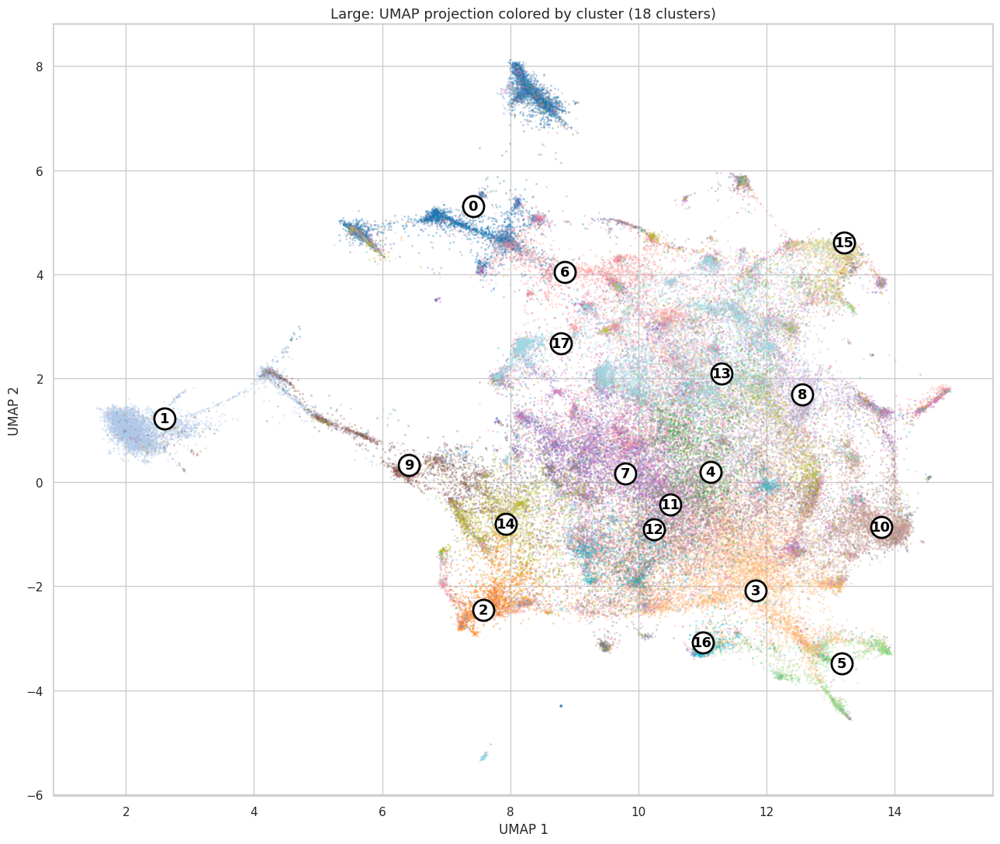

In [24]:
# UMAP scatter colored by cluster
fig, ax = plt.subplots(figsize=(13, 11))
k = n_clusters_large

if k <= 20:
    palette = plt.cm.tab20(np.linspace(0, 1, k))
elif k <= 100:
    palette = sns.husl_palette(k, l=0.65, s=0.85)
else:
    palette = sns.husl_palette(k, l=0.6, s=0.85)

# Point rendering
point_alpha = 0.35 if k <= 20 else (0.3 if k <= 100 else 0.22)
point_size = 4 if k <= 20 else (2.5 if k <= 100 else 2)

for cid in range(k):
    mask = labels == cid
    color = palette[cid]
    ax.scatter(umap_coords[mask, 0], umap_coords[mask, 1],
               c=[color], s=point_size, alpha=point_alpha, linewidth=0)

# Centroids and labels
cent_2d = CENTROIDS_2D["large"]

if k <= 20:
    # All centroids labeled with big text
    ax.scatter(cent_2d[:, 0], cent_2d[:, 1], c="white", s=380, marker="o",
               edgecolors="black", linewidths=2, zorder=10)
    for i in range(k):
        ax.text(cent_2d[i, 0], cent_2d[i, 1], str(i), fontsize=13, fontweight="bold",
                ha="center", va="center", color="black", zorder=11)
else:
    # For 100/517: small centroid dots, label only top 10
    ax.scatter(cent_2d[:, 0], cent_2d[:, 1], c="black", s=25, marker="o",
               edgecolors="white", linewidths=0.8, zorder=10)
    top10 = np.argsort(-sizes_large)[:10]
    for i in top10:
        ax.annotate(f"{i}", cent_2d[i], fontsize=10, fontweight="bold",
                    color="white",
                    xytext=(4, 4), textcoords="offset points",
                    path_effects=[
                        __import__("matplotlib.patheffects", fromlist=["withStroke"]).withStroke(
                            linewidth=3, foreground="black")
                    ])

ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.set_title(f"Large: UMAP projection colored by cluster ({k} clusters)", fontsize=13)
plt.tight_layout()
plt.savefig(FIG_DIR / "large_11_umap_clusters.png")
plt.show()


> *Plot L11*: UMAP-проекция с цветовой кодировкой кластеров и центроидами.

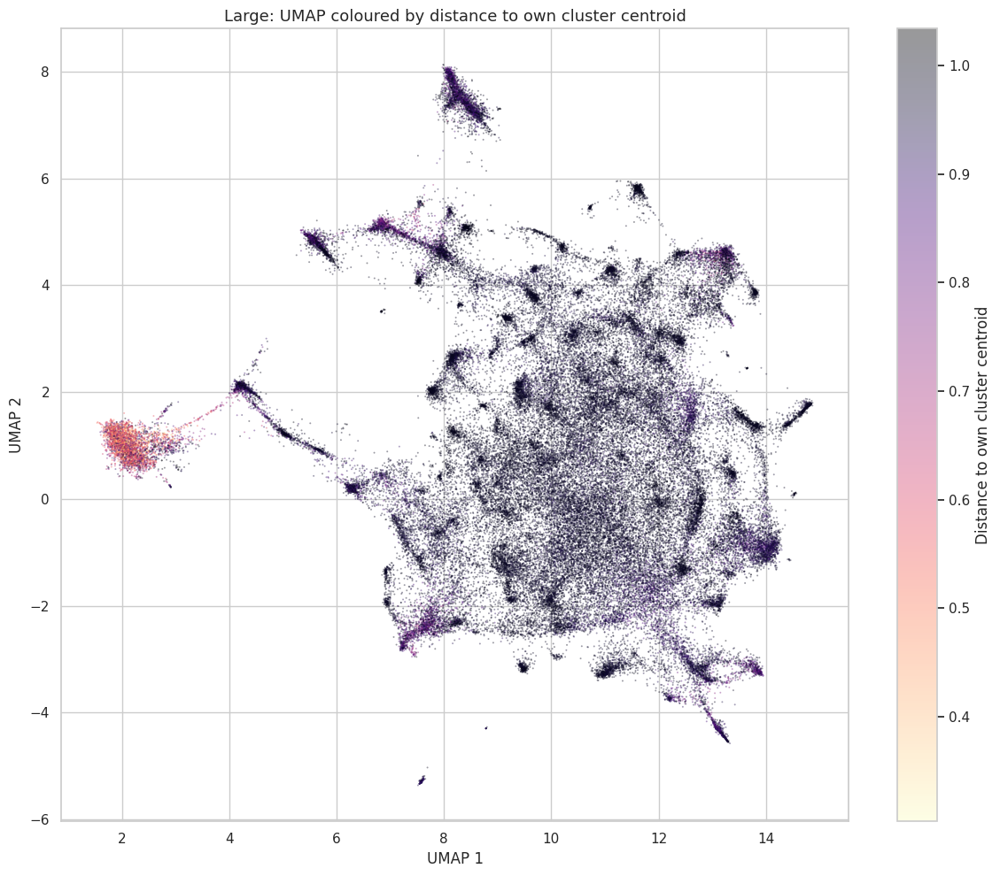

In [25]:
# UMAP colored by per-point distance-to-own-centroid
# (field `densities` in labels.npz = Euclidean distance to own cluster centroid)
fig, ax = plt.subplots(figsize=(12, 10))
sc = ax.scatter(umap_coords[:, 0], umap_coords[:, 1],
                c=densities, s=2, alpha=0.4, cmap="magma_r", linewidth=0)
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Distance to own cluster centroid")
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.set_title(f"Large: UMAP coloured by distance to own cluster centroid", fontsize=13)
plt.tight_layout()
plt.savefig(FIG_DIR / "large_12_umap_dist_to_centroid.png")
plt.show()


> *Plot L12*: UMAP, раскраска по расстоянию **до собственного центроида кластера**. Тёмные точки = близко к центру своего кластера (ядро); светлые = на периферии, далеко от центра. Помогает увидеть «размытые» или «плотные» кластеры в пространстве.

## 2. Medium — 100 кластеров

### 2.1 Статистики и метрики качества

In [26]:
# Per-cluster basic stats
level = LEVELS["medium"]
labels = level["labels"]
densities = level["densities"]
centroids = CENTROIDS["medium"]
n_clusters_medium = level["n_clusters"]

sizes_medium = np.bincount(labels[labels >= 0])
per_cluster_medium = H.compute_per_cluster_stats(vectors, labels, centroids, densities)
print(f"{n_clusters_medium} clusters computed; columns: {list(per_cluster_medium.columns)}")
per_cluster_medium.describe()


100 clusters computed; columns: ['size', 'inertia', 'mean_dist', 'median_dist', 'max_dist', 'std_dist', 'mean_density', 'median_density']


,size,inertia,mean_dist,median_dist,max_dist,std_dist,mean_density,median_density
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,794.850000,982.376313,1.073083,1.094293,1.286012,0.117278,0.888332,0.896705
std,258.719433,473.629489,0.205220,0.207366,0.156629,0.048810,0.134414,0.136609
min,223.000000,56.949623,0.263599,0.254869,0.549641,0.034362,0.261904,0.252899
25%,611.750000,619.985504,1.028143,1.056660,1.258221,0.088089,0.884515,0.897176
50%,794.500000,954.042175,1.115698,1.144464,1.315825,0.111728,0.927096,0.938964
75%,994.000000,1374.526550,1.195875,1.215112,1.363516,0.145318,0.959264,0.965415
max,1243.000000,2017.004395,1.309159,1.308942,1.494401,0.261957,0.989801,0.989675


In [27]:
# Distribution summary
dist_medium = H.distribution_summary(sizes_medium)
print(json.dumps(dist_medium, indent=2, default=float))


{
  "n_clusters": 100,
  "min": 223,
  "max": 1243,
  "mean": 794.85,
  "median": 794.5,
  "std": 257.4225854504612,
  "cv": 0.32386310052269135,
  "max_min_ratio": 5.573991031390134,
  "gini": 0.1856135119833931,
  "entropy": 4.54898724281842,
  "entropy_norm": 0.9878000289021638,
  "outlier_frac_2sigma": 0.02
}


In [28]:
# Quality metrics: silhouette (stratified), Davies-Bouldin, Calinski-Harabasz, Dunn
sil_cache = CACHE_DIR / "silhouette_medium.npz"
if sil_cache.exists():
    cached = np.load(sil_cache)
    sil_mean_medium = float(cached["mean"])
    sil_scores_medium = cached["scores"]
    sil_idx_medium = cached["indices"]
    print(f"Silhouette loaded from cache: mean={sil_mean_medium:.4f}")
else:
    sil_mean_medium, sil_scores_medium, sil_idx_medium = H.silhouette_sampled(
        vectors, labels,
        sample_size=SILHOUETTE_SAMPLE_MEDIUM,
        min_per_cluster=20,
        metric="cosine",
        rng=np.random.default_rng(RNG_SEED),
    )
    np.savez(sil_cache, mean=sil_mean_medium, scores=sil_scores_medium, indices=sil_idx_medium)
    print(f"Silhouette computed: mean={sil_mean_medium:.4f} (stratified sample n={len(sil_idx_medium)})")

db_medium = H.davies_bouldin_full(vectors, labels)
ch_medium = H.calinski_harabasz_full(vectors, labels)
max_radii_medium = per_cluster_medium["max_dist"].values
dunn_medium = H.dunn_index_centroid(centroids, max_radii_medium, metric="cosine")

# Store globally
QUALITY.setdefault("all", {})
QUALITY["medium"] = {
    "silhouette": sil_mean_medium,
    "davies_bouldin": db_medium,
    "calinski_harabasz": ch_medium,
    "dunn": dunn_medium,
}

print(f"Silhouette: {sil_mean_medium:.4f}")
print(f"Davies-Bouldin: {db_medium:.4f} (lower = better)")
print(f"Calinski-Harabasz: {ch_medium:.1f} (higher = better)")
print(f"Dunn (centroid-based): {dunn_medium:.4f} (higher = better)")


Silhouette computed: mean=-0.0061 (stratified sample n=10000)
Silhouette: -0.0061
Davies-Bouldin: 7.1390 (lower = better)
Calinski-Harabasz: 173.6 (higher = better)
Dunn (centroid-based): 0.0014 (higher = better)


In [29]:
# Per-cluster silhouette (from stratified sample)
sample_labels_medium = labels[sil_idx_medium]
per_cluster_sil_medium = H.silhouette_per_cluster(sil_scores_medium, sample_labels_medium)

# Add silhouette + anchors + mean_density (already in per_cluster) to summary table
summary_medium = per_cluster_medium.copy()
summary_medium["silhouette"] = [per_cluster_sil_medium.get(cid, np.nan) for cid in summary_medium.index]
summary_medium["anchors"] = [", ".join(ANCHORS["medium"].get(cid, [])[:3]) for cid in summary_medium.index]
summary_medium = summary_medium.sort_values("size", ascending=False)
summary_medium.head(20)


,size,inertia,mean_dist,median_dist,max_dist,std_dist,mean_density,median_density,silhouette,anchors
cluster_id,,,,,,,,,,
9,1243,1725.085693,1.172793,1.193326,1.356237,0.111344,0.951158,0.957805,-0.086151,"saith, nay, unto"
17,1234,1334.662476,1.027791,1.049457,1.297608,0.158808,0.884547,0.893426,0.066143,"stew, sausage, cheese"
48,1226,542.358643,0.631062,0.667323,0.993975,0.210098,0.604896,0.629082,0.413182,"mair, maun, ane"
50,1211,2017.004395,1.289941,1.291215,1.425112,0.040254,0.985881,0.986062,-0.054460,"barking, ercole, yallah"
12,1208,1560.328369,1.131771,1.159640,1.311525,0.103717,0.934170,0.945184,-0.000021,"behalf, incur, offence"
59,1183,1346.154785,1.055941,1.077181,1.314873,0.151344,0.899252,0.907667,0.035346,"blouse, jacket, collar"
42,1181,1419.904053,1.091067,1.111145,1.303843,0.108912,0.915617,0.924024,0.008050,"temperament, perception, egotism"
45,1175,1869.205322,1.259682,1.270062,1.402022,0.063357,0.978710,0.981169,-0.077567,"favourite, dean, condescend"
4,1168,1646.212646,1.183286,1.212420,1.353067,0.096237,0.954795,0.964718,-0.038431,"immobility, pallor, strangely"


### 2.2 Распределение размеров кластеров

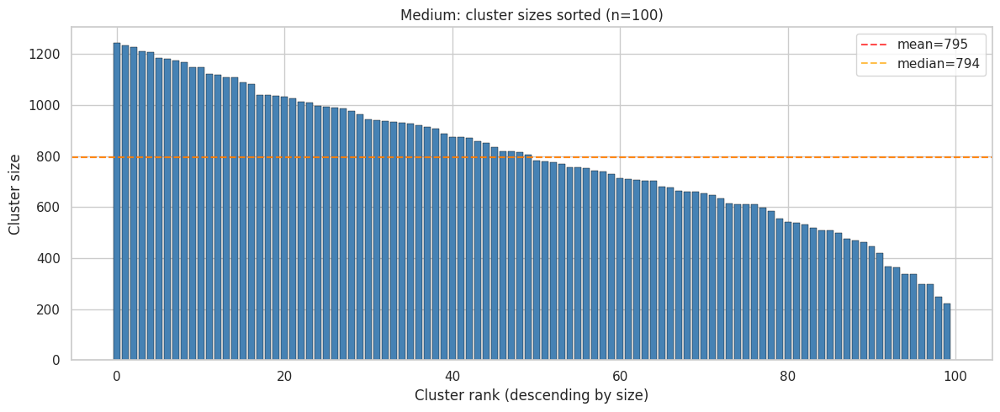

In [30]:
# Plot: sorted bar chart of cluster sizes
fig, ax = plt.subplots(figsize=(12, 5))
sorted_sizes = np.sort(sizes_medium)[::-1]
ax.bar(range(len(sorted_sizes)), sorted_sizes, color="steelblue", edgecolor="black", linewidth=0.3)
ax.axhline(sorted_sizes.mean(), color="red", linestyle="--", alpha=0.7, label=f"mean={sorted_sizes.mean():.0f}")
ax.axhline(np.median(sorted_sizes), color="orange", linestyle="--", alpha=0.7, label=f"median={np.median(sorted_sizes):.0f}")
ax.set_xlabel("Cluster rank (descending by size)")
ax.set_ylabel("Cluster size")
ax.set_title(f"Medium: cluster sizes sorted (n={len(sorted_sizes)})")
ax.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "medium_01_sizes_sorted.png")
plt.show()


> *Plot M1 — описание*: распределение размеров кластеров, отсортированных по убыванию.

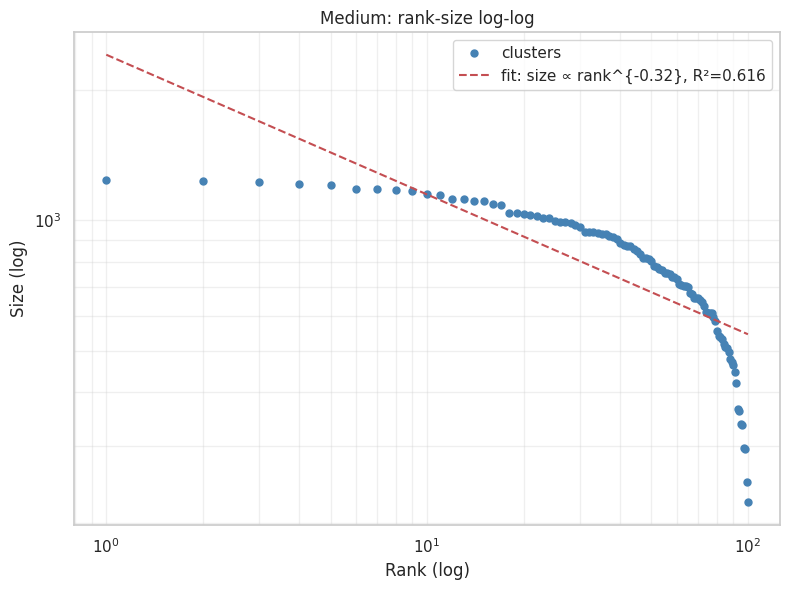

In [31]:
# Plot: rank-size log-log with power law fit
from scipy.stats import linregress
fig, ax = plt.subplots(figsize=(8, 6))
ranks = np.arange(1, len(sizes_medium) + 1)
sorted_sizes_desc = np.sort(sizes_medium)[::-1]
ax.loglog(ranks, sorted_sizes_desc, "o", markersize=5, color="steelblue", label="clusters")

# Power law fit: log(size) = a * log(rank) + b
log_rank = np.log(ranks)
log_size = np.log(sorted_sizes_desc)
slope, intercept, r_value, _, _ = linregress(log_rank, log_size)
fit_y = np.exp(intercept + slope * log_rank)
ax.loglog(ranks, fit_y, "r--", label=f"fit: size ∝ rank^{{{slope:.2f}}}, R²={r_value**2:.3f}")

ax.set_xlabel("Rank (log)")
ax.set_ylabel("Size (log)")
ax.set_title(f"Medium: rank-size log-log")
ax.legend()
ax.grid(True, which="both", alpha=0.3)
plt.tight_layout()
plt.savefig(FIG_DIR / "medium_02_rank_size_loglog.png")
plt.show()


> *Plot M2*: log-log rank-size — наклон ~-1 соответствует Zipf.

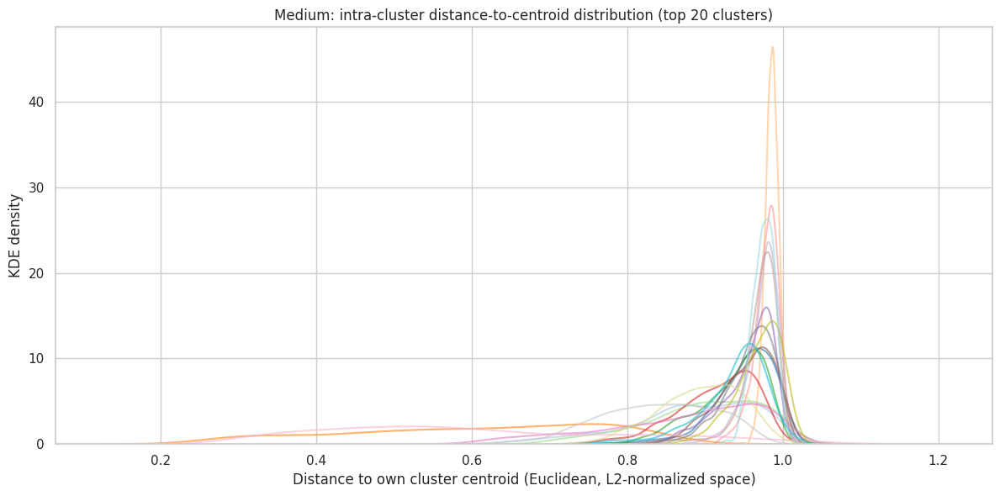

In [32]:
# Plot: per-cluster KDE of distances from each point to its cluster centroid
# NOTE: field `densities` in labels.npz actually stores distance-to-own-centroid
# (Euclidean on L2-normalized vectors). Not probability density.
fig, ax = plt.subplots(figsize=(12, 6))

# For large (18): all clusters; for medium/small: limit to top N for clarity
max_show = min(20, n_clusters_medium)
top_cids = np.argsort(-sizes_medium)[:max_show]
cmap = plt.cm.tab20(np.linspace(0, 1, max_show))

for i, cid in enumerate(top_cids):
    mask = labels == cid
    sns.kdeplot(densities[mask], ax=ax, color=cmap[i], alpha=0.6, linewidth=1.5,
                label=f"{cid} (n={mask.sum()})" if max_show <= 18 else None)

ax.set_xlabel("Distance to own cluster centroid (Euclidean, L2-normalized space)")
ax.set_ylabel("KDE density")
ax.set_title(f"Medium: intra-cluster distance-to-centroid distribution (top {max_show} clusters)", fontsize=12)
if max_show <= 18:
    ax.legend(ncol=3, fontsize=8, loc="upper right", title="cluster (n)")
plt.tight_layout()
plt.savefig(FIG_DIR / "medium_03_intra_dist_kde.png")
plt.show()


> *Plot M3*: KDE расстояний от каждой точки до **её собственного центроида**. Узкий пик слева = компактный кластер; широкий/смещённый вправо = рыхлый.

/tmp/ipykernel_813753/1057748348.py:26: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(box_data, labels=box_labels, patch_artist=True, showfliers=False)


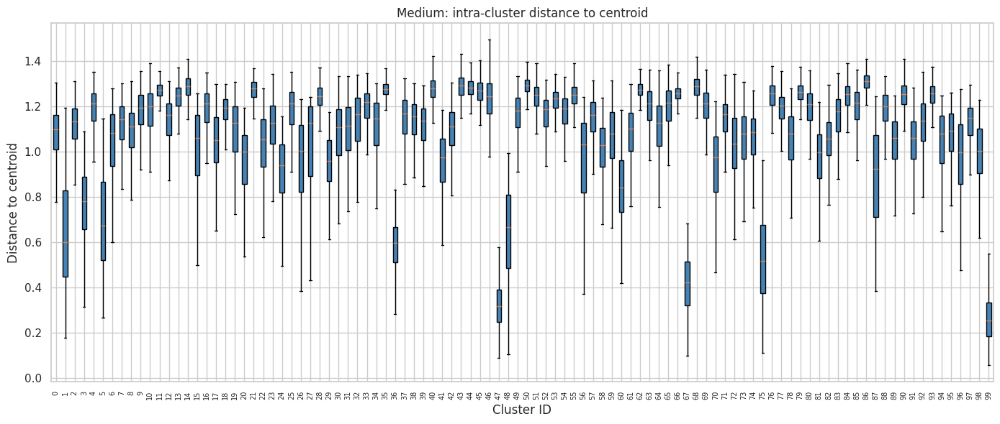

In [33]:
# Plot: boxplot of intra-cluster distance to centroid
fig, ax = plt.subplots(figsize=(14, 6))

# For small: only show selection
if "medium" == "small":
    show_cids = SEL_SMALL["combined"]
    sel_groups = SEL_SMALL["group"]
else:
    show_cids = list(range(n_clusters_medium))
    sel_groups = None

box_data = []
box_labels = []
box_colors = []
for i, cid in enumerate(show_cids):
    mask = labels == cid
    if mask.any():
        dists = np.linalg.norm(vectors[mask] - centroids[cid], axis=1)
        box_data.append(dists)
        box_labels.append(str(cid))
        if sel_groups is not None:
            box_colors.append("steelblue" if sel_groups[i] == "top" else "coral")
        else:
            box_colors.append("steelblue")

bp = ax.boxplot(box_data, labels=box_labels, patch_artist=True, showfliers=False)
for patch, color in zip(bp["boxes"], box_colors):
    patch.set_facecolor(color)

ax.set_xlabel("Cluster ID")
ax.set_ylabel("Distance to centroid")
ax.set_title(f"Medium: intra-cluster distance to centroid")
if sel_groups is not None:
    from matplotlib.patches import Patch
    ax.legend(handles=[Patch(color="steelblue", label="Top-20"), Patch(color="coral", label="Random-20")])
if len(show_cids) > 30:
    plt.xticks(rotation=90, fontsize=7)
plt.tight_layout()
plt.savefig(FIG_DIR / "medium_04_intra_dist_boxplot.png")
plt.show()


> *Plot M4*: компактность кластеров — распределение расстояний точек до центроида.

### 2.3 Качество кластеризации

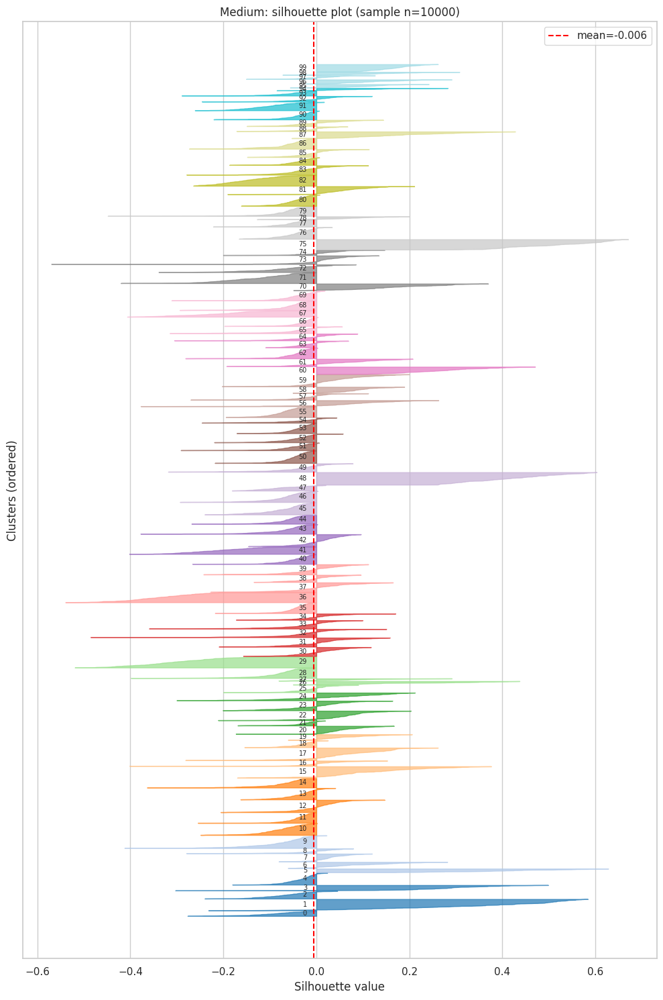

In [34]:
# Silhouette plot (horizontal bars per point, grouped by cluster)
fig, ax = plt.subplots(figsize=(10, max(6, n_clusters_medium * 0.15)))

# For small, limit to selection for readability
if "medium" == "small":
    sel_cids = SEL_SMALL["combined"]
    mask_sel = np.isin(sample_labels_medium, sel_cids)
    ss = sil_scores_medium[mask_sel]
    sl = sample_labels_medium[mask_sel]
    show_cids = sel_cids
    ax.set_title(f"Medium: silhouette plot (selection: Top-20 + Random-20, sample={mask_sel.sum()})")
else:
    ss = sil_scores_medium
    sl = sample_labels_medium
    show_cids = list(range(n_clusters_medium))
    ax.set_title(f"Medium: silhouette plot (sample n={len(ss)})")

y_lower = 0
cmap = plt.cm.tab20(np.linspace(0, 1, len(show_cids)))
for i, cid in enumerate(show_cids):
    cluster_ss = np.sort(ss[sl == cid])
    if len(cluster_ss) == 0:
        continue
    y_upper = y_lower + len(cluster_ss)
    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_ss,
                     facecolor=cmap[i], edgecolor=cmap[i], alpha=0.7)
    ax.text(-0.02, y_lower + len(cluster_ss) / 2, str(cid), fontsize=7, ha="right", va="center")
    y_lower = y_upper + 5

ax.axvline(sil_mean_medium, color="red", linestyle="--", label=f"mean={sil_mean_medium:.3f}")
ax.set_xlabel("Silhouette value")
ax.set_ylabel("Clusters (ordered)")
ax.legend()
ax.set_yticks([])
plt.tight_layout()
plt.savefig(FIG_DIR / "medium_05_silhouette_plot.png")
plt.show()


> *Plot M5*: классический silhouette plot — ширина полосы = silhouette score каждой точки.

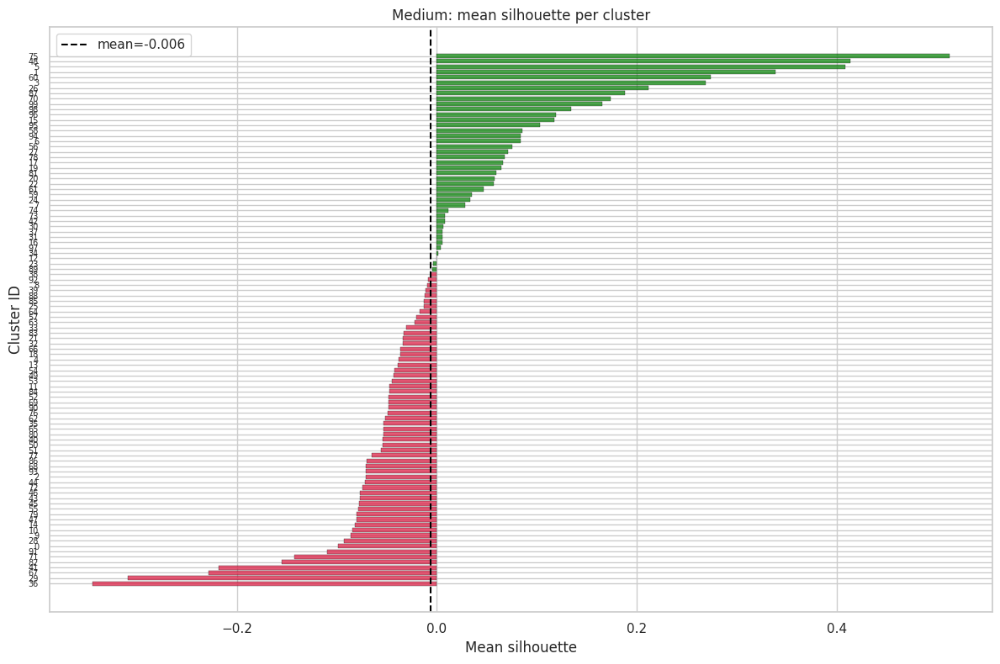

In [35]:
# Bar chart: mean silhouette per cluster
fig, ax = plt.subplots(figsize=(12, max(5, n_clusters_medium * 0.08)))

cids = sorted(per_cluster_sil_medium.keys())
vals = [per_cluster_sil_medium[c] for c in cids]
order = np.argsort(vals)
cids_sorted = [cids[i] for i in order]
vals_sorted = [vals[i] for i in order]

colors = ["green" if v > sil_mean_medium else "crimson" for v in vals_sorted]
ax.barh(range(len(cids_sorted)), vals_sorted, color=colors, alpha=0.7, edgecolor="black", linewidth=0.3)
ax.axvline(sil_mean_medium, color="black", linestyle="--", label=f"mean={sil_mean_medium:.3f}")
ax.set_yticks(range(len(cids_sorted)))
ax.set_yticklabels(cids_sorted, fontsize=7 if n_clusters_medium > 50 else 9)
ax.set_xlabel("Mean silhouette")
ax.set_ylabel("Cluster ID")
ax.set_title(f"Medium: mean silhouette per cluster")
ax.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "medium_06_silhouette_per_cluster.png")
plt.show()


> *Plot M6*: средний silhouette каждого кластера. Красные — ниже среднего.

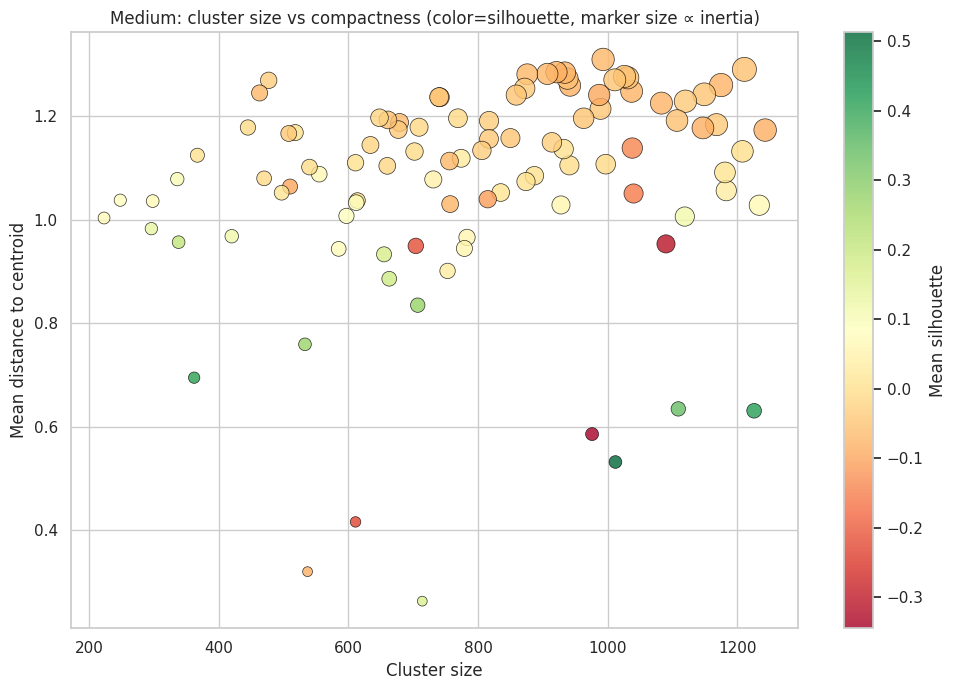

In [36]:
# Scatter: size vs mean intra-distance, color=silhouette, marker size ∝ inertia
fig, ax = plt.subplots(figsize=(10, 7))
df_plot = summary_medium.copy()
sizes_s = df_plot["size"].values
mean_dists = df_plot["mean_dist"].values
sils = df_plot["silhouette"].values
inertias = df_plot["inertia"].values

marker_sizes = 50 + 250 * (inertias - inertias.min()) / (inertias.max() - inertias.min() + 1e-9)
sc = ax.scatter(sizes_s, mean_dists, c=sils, s=marker_sizes,
                cmap="RdYlGn", alpha=0.8, edgecolor="black", linewidth=0.5)
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Mean silhouette")
ax.set_xlabel("Cluster size")
ax.set_ylabel("Mean distance to centroid")
ax.set_title(f"Medium: cluster size vs compactness (color=silhouette, marker size ∝ inertia)")
if "medium" == "large":
    for cid, row in df_plot.iterrows():
        ax.annotate(str(cid), (row["size"], row["mean_dist"]), fontsize=8)
plt.tight_layout()
plt.savefig(FIG_DIR / "medium_07_size_vs_compactness.png")
plt.show()


> *Plot M7*: зависимость компактности от размера кластера.

### 2.4 Межкластерная структура

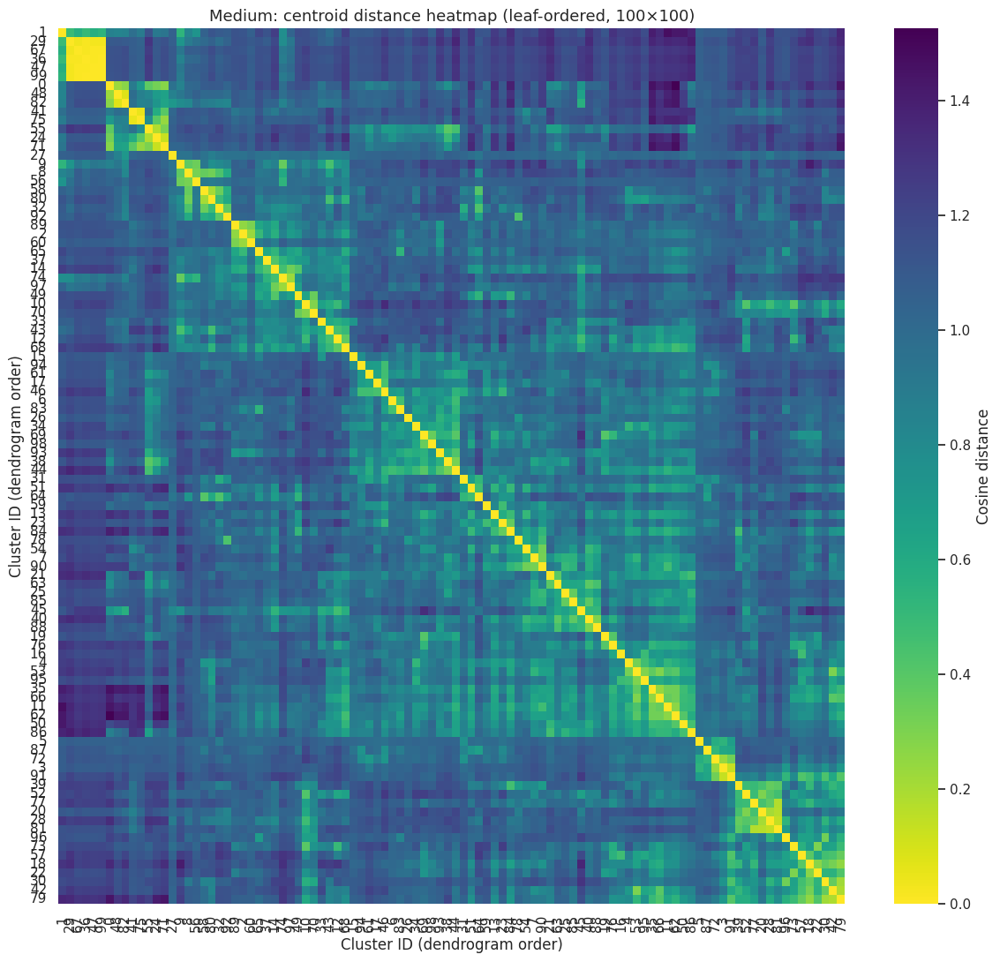

In [37]:
# Heatmap of centroid cosine distances, ordered by hierarchical clustering
dist_mat = H.centroid_distance_matrix(centroids, metric="cosine")
Z = sch.linkage(squareform(dist_mat, checks=False), method="average")
leaves = sch.leaves_list(Z)
dist_mat_ord = dist_mat[leaves][:, leaves]

fig, ax = plt.subplots(figsize=(max(12, min(n_clusters_medium * 0.12, 16)), max(10, min(n_clusters_medium * 0.11, 14))))
sns.heatmap(dist_mat_ord,
            annot=(n_clusters_medium <= 20),
            fmt=".2f",
            cmap="viridis_r",
            xticklabels=leaves if n_clusters_medium <= 100 else False,
            yticklabels=leaves if n_clusters_medium <= 100 else False,
            ax=ax, cbar_kws={"label": "Cosine distance"})
ax.set_title(f"Medium: centroid distance heatmap (leaf-ordered, {n_clusters_medium}×{n_clusters_medium})", fontsize=13)
ax.set_xlabel("Cluster ID (dendrogram order)")
ax.set_ylabel("Cluster ID (dendrogram order)")
plt.tight_layout()
plt.savefig(FIG_DIR / "medium_08_centroid_heatmap.png")
plt.show()


> *Plot M8*: матрица косинусных расстояний между центроидами.

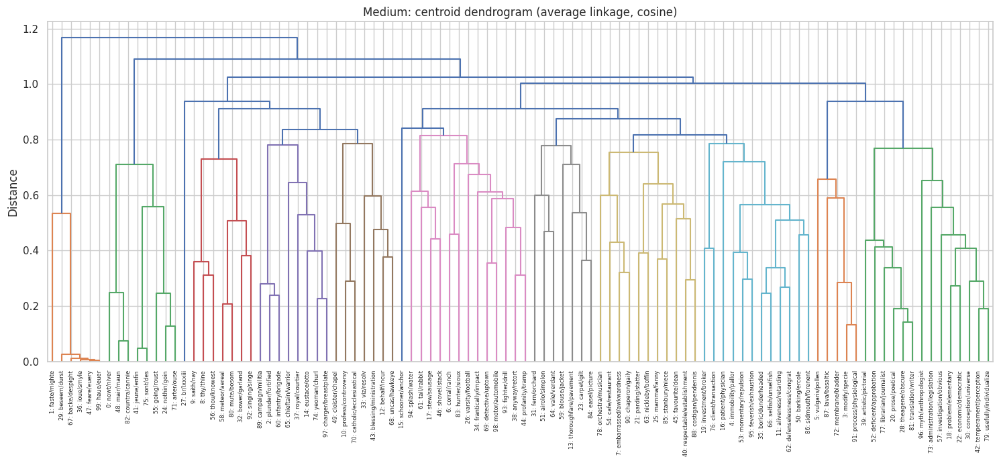

In [38]:
# Dendrogram of centroids
fig, ax = plt.subplots(figsize=(max(14, n_clusters_medium * 0.15), 7))
labels_dendro = [f"{cid}: {'/'.join(ANCHORS['medium'].get(cid, [])[:2])}" for cid in range(n_clusters_medium)]

# For small, truncate
if n_clusters_medium > 100:
    sch.dendrogram(Z, ax=ax, truncate_mode="lastp", p=50, leaf_font_size=8,
                   show_contracted=True)
    ax.set_title(f"Medium: centroid dendrogram (truncated to 50 leaves)")
else:
    sch.dendrogram(Z, ax=ax, labels=labels_dendro, leaf_font_size=8 if n_clusters_medium <= 20 else 6,
                   leaf_rotation=90)
    ax.set_title(f"Medium: centroid dendrogram (average linkage, cosine)")

ax.set_ylabel("Distance")
plt.tight_layout()
plt.savefig(FIG_DIR / "medium_09_dendrogram.png")
plt.show()


> *Plot M9*: иерархия кластеров (average linkage) с anchor-словами в листах.

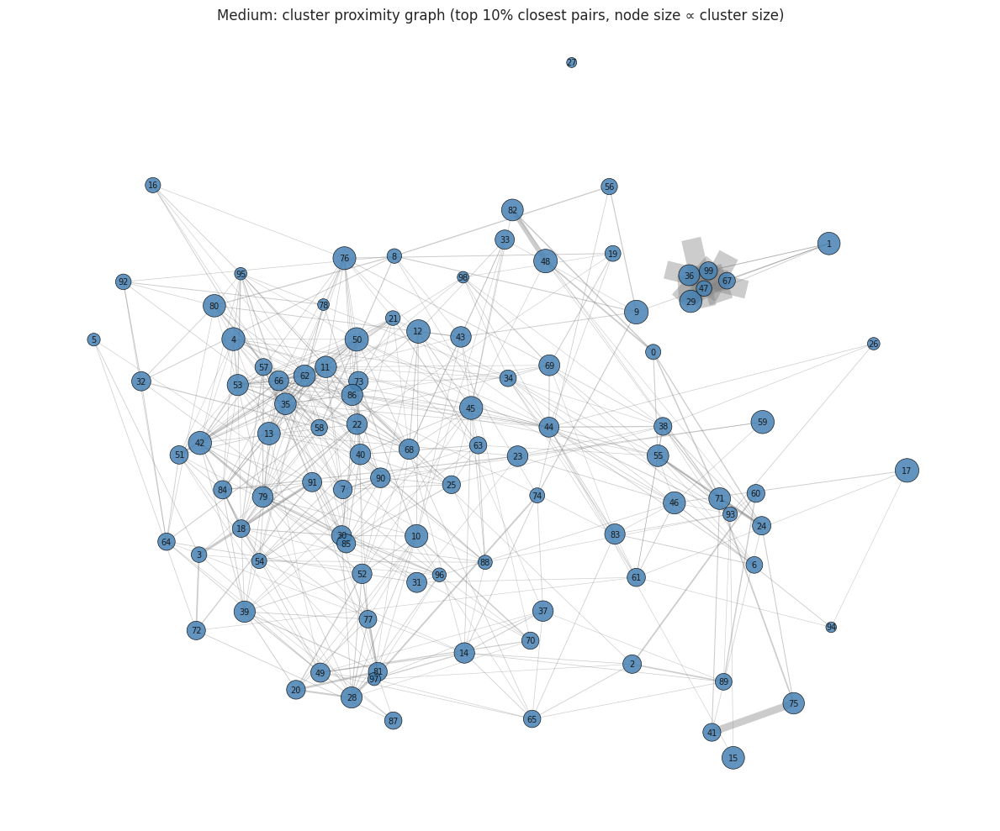

In [39]:
# Force-directed graph of closest centroid pairs
import networkx as nx
n_edges_show = int(n_clusters_medium * (n_clusters_medium - 1) / 2 * 0.10)  # top 10%
mask_tri = np.triu(np.ones_like(dist_mat, dtype=bool), k=1)
pairs = [(i, j, dist_mat[i, j]) for i, j in zip(*np.where(mask_tri))]
pairs.sort(key=lambda x: x[2])
top_pairs = pairs[:max(n_edges_show, n_clusters_medium)]

G = nx.Graph()
for i in range(n_clusters_medium):
    G.add_node(i, size=int(sizes_medium[i]))
for i, j, d in top_pairs:
    G.add_edge(int(i), int(j), weight=1.0 / (d + 1e-6))

pos = nx.spring_layout(G, seed=42, k=0.8)
fig, ax = plt.subplots(figsize=(12, 10))
node_sizes = [G.nodes[n]["size"] / 3 for n in G.nodes]
edge_widths = [G.edges[e]["weight"] * 0.3 for e in G.edges]
nx.draw_networkx_edges(G, pos, ax=ax, width=edge_widths, alpha=0.4, edge_color="gray")
nx.draw_networkx_nodes(G, pos, ax=ax, node_size=node_sizes, node_color="steelblue",
                        edgecolors="black", linewidths=0.5, alpha=0.85)
if n_clusters_medium <= 100:
    nx.draw_networkx_labels(G, pos, ax=ax, font_size=7)
ax.set_title(f"Medium: cluster proximity graph (top 10% closest pairs, node size ∝ cluster size)")
ax.axis("off")
plt.tight_layout()
plt.savefig(FIG_DIR / "medium_10_network.png")
plt.show()


> *Plot M10*: граф близости — связи между семантически близкими кластерами.

### 2.5 2D проекция UMAP

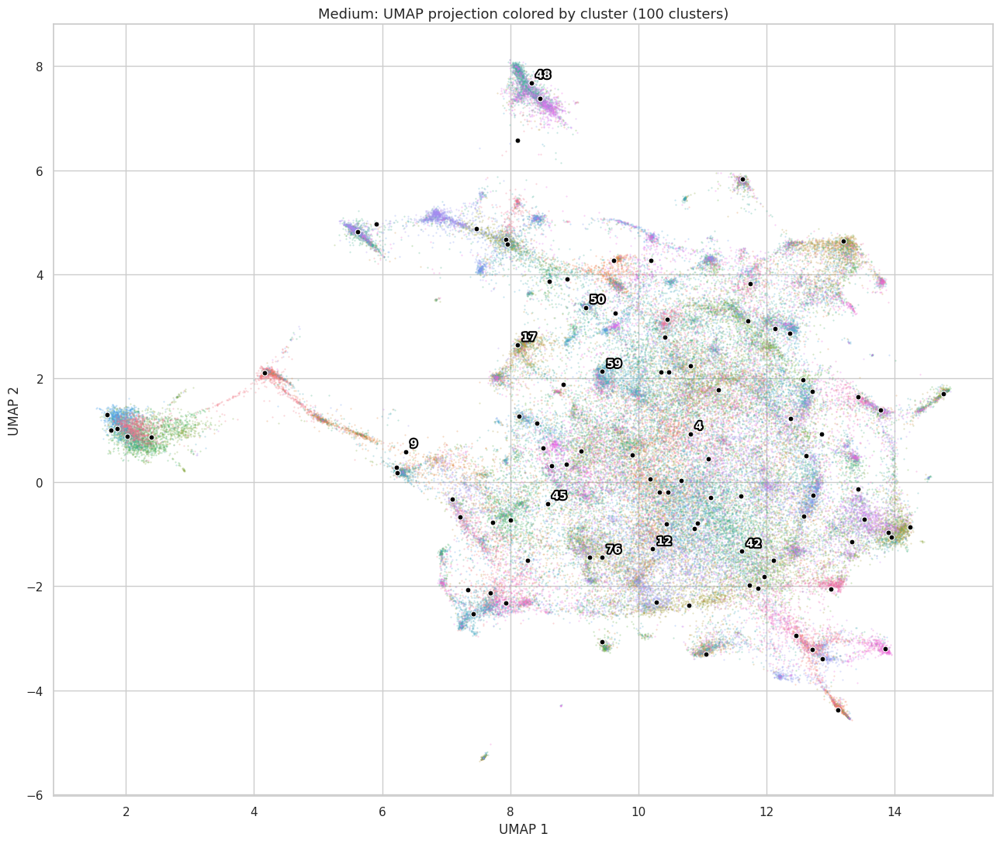

In [40]:
# UMAP scatter colored by cluster
fig, ax = plt.subplots(figsize=(13, 11))
k = n_clusters_medium

if k <= 20:
    palette = plt.cm.tab20(np.linspace(0, 1, k))
elif k <= 100:
    palette = sns.husl_palette(k, l=0.65, s=0.85)
else:
    palette = sns.husl_palette(k, l=0.6, s=0.85)

# Point rendering
point_alpha = 0.35 if k <= 20 else (0.3 if k <= 100 else 0.22)
point_size = 4 if k <= 20 else (2.5 if k <= 100 else 2)

for cid in range(k):
    mask = labels == cid
    color = palette[cid]
    ax.scatter(umap_coords[mask, 0], umap_coords[mask, 1],
               c=[color], s=point_size, alpha=point_alpha, linewidth=0)

# Centroids and labels
cent_2d = CENTROIDS_2D["medium"]

if k <= 20:
    # All centroids labeled with big text
    ax.scatter(cent_2d[:, 0], cent_2d[:, 1], c="white", s=380, marker="o",
               edgecolors="black", linewidths=2, zorder=10)
    for i in range(k):
        ax.text(cent_2d[i, 0], cent_2d[i, 1], str(i), fontsize=13, fontweight="bold",
                ha="center", va="center", color="black", zorder=11)
else:
    # For 100/517: small centroid dots, label only top 10
    ax.scatter(cent_2d[:, 0], cent_2d[:, 1], c="black", s=25, marker="o",
               edgecolors="white", linewidths=0.8, zorder=10)
    top10 = np.argsort(-sizes_medium)[:10]
    for i in top10:
        ax.annotate(f"{i}", cent_2d[i], fontsize=10, fontweight="bold",
                    color="white",
                    xytext=(4, 4), textcoords="offset points",
                    path_effects=[
                        __import__("matplotlib.patheffects", fromlist=["withStroke"]).withStroke(
                            linewidth=3, foreground="black")
                    ])

ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.set_title(f"Medium: UMAP projection colored by cluster ({k} clusters)", fontsize=13)
plt.tight_layout()
plt.savefig(FIG_DIR / "medium_11_umap_clusters.png")
plt.show()


> *Plot M11*: UMAP-проекция с цветовой кодировкой кластеров и центроидами.

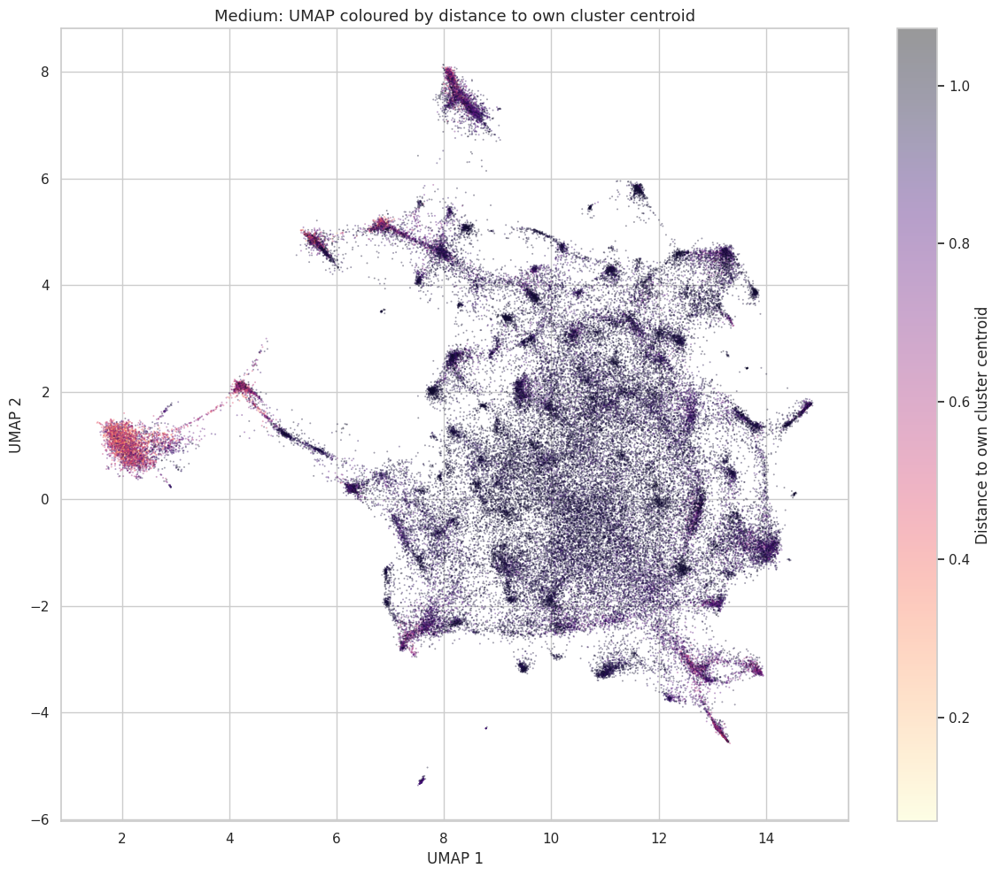

In [41]:
# UMAP colored by per-point distance-to-own-centroid
# (field `densities` in labels.npz = Euclidean distance to own cluster centroid)
fig, ax = plt.subplots(figsize=(12, 10))
sc = ax.scatter(umap_coords[:, 0], umap_coords[:, 1],
                c=densities, s=2, alpha=0.4, cmap="magma_r", linewidth=0)
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Distance to own cluster centroid")
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.set_title(f"Medium: UMAP coloured by distance to own cluster centroid", fontsize=13)
plt.tight_layout()
plt.savefig(FIG_DIR / "medium_12_umap_dist_to_centroid.png")
plt.show()


> *Plot M12*: UMAP, раскраска по расстоянию **до собственного центроида кластера**. Тёмные точки = близко к центру своего кластера (ядро); светлые = на периферии, далеко от центра. Помогает увидеть «размытые» или «плотные» кластеры в пространстве.

## 3. Small — 517 кластеров

### 3.1 Статистики и метрики качества

In [42]:
# Per-cluster basic stats
level = LEVELS["small"]
labels = level["labels"]
densities = level["densities"]
centroids = CENTROIDS["small"]
n_clusters_small = level["n_clusters"]

sizes_small = np.bincount(labels[labels >= 0])
per_cluster_small = H.compute_per_cluster_stats(vectors, labels, centroids, densities)
print(f"{n_clusters_small} clusters computed; columns: {list(per_cluster_small.columns)}")
per_cluster_small.describe()


517 clusters computed; columns: ['size', 'inertia', 'mean_dist', 'median_dist', 'max_dist', 'std_dist', 'mean_density', 'median_density']


,size,inertia,mean_dist,median_dist,max_dist,std_dist,mean_density,median_density
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,153.742747,170.974914,1.031419,1.047088,1.223900,0.106413,0.866138,0.872838
std,47.291214,75.438050,0.208339,0.210044,0.161572,0.044551,0.138904,0.140354
min,95.000000,8.888904,0.206008,0.192384,0.488510,0.032294,0.205207,0.191592
25%,118.000000,120.333923,0.957571,0.979820,1.194193,0.069577,0.843117,0.854652
50%,144.000000,162.819077,1.077565,1.099940,1.270969,0.106664,0.909229,0.918729
75%,180.000000,216.061432,1.191746,1.204363,1.319252,0.137324,0.957622,0.961515
max,347.000000,452.887817,1.272384,1.273221,1.400118,0.261772,0.981800,0.982157


In [43]:
# Distribution summary
dist_small = H.distribution_summary(sizes_small)
print(json.dumps(dist_small, indent=2, default=float))


{
  "n_clusters": 517,
  "min": 95,
  "max": 347,
  "mean": 153.74274661508704,
  "median": 144.0,
  "std": 47.24545530526254,
  "cv": 0.30730201160999854,
  "max_min_ratio": 3.6526315789473682,
  "gini": 0.16440482608727922,
  "entropy": 6.204512098826262,
  "entropy_norm": 0.9930328942107984,
  "outlier_frac_2sigma": 0.05029013539651837
}


In [44]:
# Quality metrics: silhouette (stratified), Davies-Bouldin, Calinski-Harabasz, Dunn
sil_cache = CACHE_DIR / "silhouette_small.npz"
if sil_cache.exists():
    cached = np.load(sil_cache)
    sil_mean_small = float(cached["mean"])
    sil_scores_small = cached["scores"]
    sil_idx_small = cached["indices"]
    print(f"Silhouette loaded from cache: mean={sil_mean_small:.4f}")
else:
    sil_mean_small, sil_scores_small, sil_idx_small = H.silhouette_sampled(
        vectors, labels,
        sample_size=SILHOUETTE_SAMPLE_SMALL,
        min_per_cluster=20,
        metric="cosine",
        rng=np.random.default_rng(RNG_SEED),
    )
    np.savez(sil_cache, mean=sil_mean_small, scores=sil_scores_small, indices=sil_idx_small)
    print(f"Silhouette computed: mean={sil_mean_small:.4f} (stratified sample n={len(sil_idx_small)})")

db_small = H.davies_bouldin_full(vectors, labels)
ch_small = H.calinski_harabasz_full(vectors, labels)
max_radii_small = per_cluster_small["max_dist"].values
dunn_small = H.dunn_index_centroid(centroids, max_radii_small, metric="cosine")

# Store globally
QUALITY.setdefault("all", {})
QUALITY["small"] = {
    "silhouette": sil_mean_small,
    "davies_bouldin": db_small,
    "calinski_harabasz": ch_small,
    "dunn": dunn_small,
}

print(f"Silhouette: {sil_mean_small:.4f}")
print(f"Davies-Bouldin: {db_small:.4f} (lower = better)")
print(f"Calinski-Harabasz: {ch_small:.1f} (higher = better)")
print(f"Dunn (centroid-based): {dunn_small:.4f} (higher = better)")


Silhouette computed: mean=-0.0654 (stratified sample n=15068)


Silhouette: -0.0654
Davies-Bouldin: 6.7833 (lower = better)
Calinski-Harabasz: 45.9 (higher = better)
Dunn (centroid-based): 0.0007 (higher = better)


In [45]:
# Per-cluster silhouette (from stratified sample)
sample_labels_small = labels[sil_idx_small]
per_cluster_sil_small = H.silhouette_per_cluster(sil_scores_small, sample_labels_small)

# Add silhouette + anchors + mean_density (already in per_cluster) to summary table
summary_small = per_cluster_small.copy()
summary_small["silhouette"] = [per_cluster_sil_small.get(cid, np.nan) for cid in summary_small.index]
summary_small["anchors"] = [", ".join(ANCHORS["small"].get(cid, [])[:3]) for cid in summary_small.index]
summary_small = summary_small.sort_values("size", ascending=False)
summary_small.head(20)


,size,inertia,mean_dist,median_dist,max_dist,std_dist,mean_density,median_density,silhouette,anchors
cluster_id,,,,,,,,,,
40,347,452.887817,1.125025,1.188093,1.395616,0.198671,0.934553,0.957218,-0.039285,"dog, terrier, yelp"
290,339,82.539398,0.462764,0.451478,0.950276,0.171256,0.452900,0.440270,0.023521,"seye, wel, wol"
86,337,269.963104,0.884719,0.889674,1.171963,0.135465,0.795448,0.796817,-0.249043,"needeth, erst, tway"
244,332,350.969055,1.023569,1.045877,1.175146,0.097166,0.880375,0.891663,-0.146128,"dedication, dramatick, plagiarism"
344,313,34.241440,0.307893,0.296089,0.566723,0.120828,0.305289,0.293027,0.487392,"que, dans, qu"
450,313,350.927856,1.025988,1.143365,1.343926,0.261772,0.890025,0.942706,0.055706,"br, lxxxiii, lxxxix"
391,299,443.307312,1.215063,1.234793,1.341681,0.079082,0.965634,0.971580,-0.094189,"impertinence, apologise, insinuate"
333,299,353.314758,1.076417,1.109502,1.329943,0.151596,0.909638,0.923453,-0.082099,"crimson, gorgeous, amber"
329,296,19.782974,0.240789,0.233074,0.502910,0.094102,0.239505,0.231570,-0.008716,"haue, selfe, euer"


In [46]:
# Selection: Top-20 by size + Random-20 — used for all per-cluster plots in Small
SEL_SMALL = H.pick_top_and_random(sizes_small, TOP_N, RANDOM_N, rng=np.random.default_rng(RNG_SEED))
print(f"Top-20 cluster IDs: {SEL_SMALL['top']}")
print(f"Random-20 cluster IDs: {SEL_SMALL['random']}")


Top-20 cluster IDs: [40, 290, 86, 244, 344, 450, 333, 391, 329, 514, 497, 349, 496, 460, 501, 417, 26, 166, 194, 175]
Random-20 cluster IDs: [382, 364, 100, 493, 430, 385, 65, 44, 322, 260, 214, 43, 229, 428, 47, 372, 400, 217, 350, 263]


### 3.2 Распределение размеров кластеров

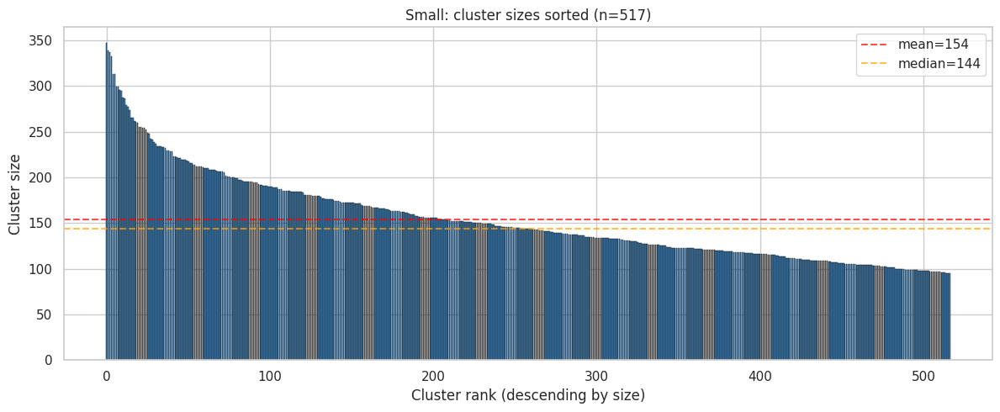

In [47]:
# Plot: sorted bar chart of cluster sizes
fig, ax = plt.subplots(figsize=(12, 5))
sorted_sizes = np.sort(sizes_small)[::-1]
ax.bar(range(len(sorted_sizes)), sorted_sizes, color="steelblue", edgecolor="black", linewidth=0.3)
ax.axhline(sorted_sizes.mean(), color="red", linestyle="--", alpha=0.7, label=f"mean={sorted_sizes.mean():.0f}")
ax.axhline(np.median(sorted_sizes), color="orange", linestyle="--", alpha=0.7, label=f"median={np.median(sorted_sizes):.0f}")
ax.set_xlabel("Cluster rank (descending by size)")
ax.set_ylabel("Cluster size")
ax.set_title(f"Small: cluster sizes sorted (n={len(sorted_sizes)})")
ax.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "small_01_sizes_sorted.png")
plt.show()


> *Plot S1 — описание*: распределение размеров кластеров, отсортированных по убыванию.

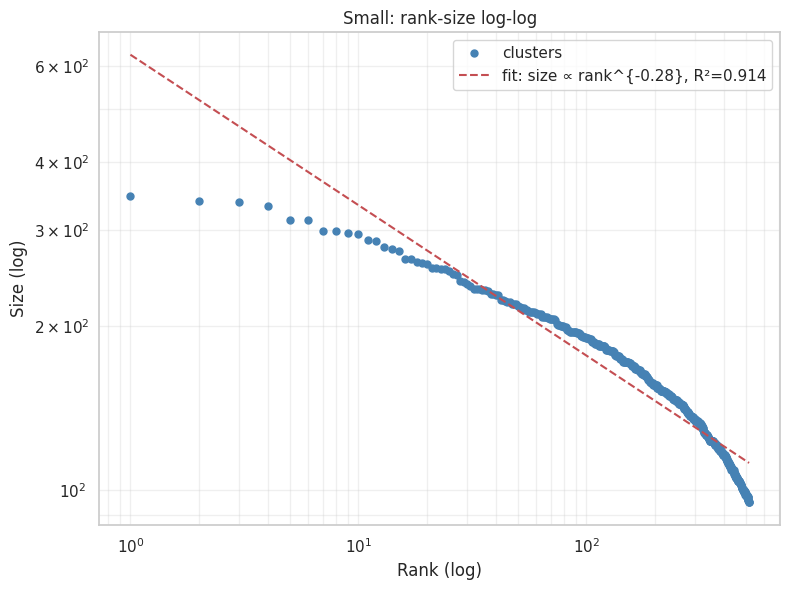

In [48]:
# Plot: rank-size log-log with power law fit
from scipy.stats import linregress
fig, ax = plt.subplots(figsize=(8, 6))
ranks = np.arange(1, len(sizes_small) + 1)
sorted_sizes_desc = np.sort(sizes_small)[::-1]
ax.loglog(ranks, sorted_sizes_desc, "o", markersize=5, color="steelblue", label="clusters")

# Power law fit: log(size) = a * log(rank) + b
log_rank = np.log(ranks)
log_size = np.log(sorted_sizes_desc)
slope, intercept, r_value, _, _ = linregress(log_rank, log_size)
fit_y = np.exp(intercept + slope * log_rank)
ax.loglog(ranks, fit_y, "r--", label=f"fit: size ∝ rank^{{{slope:.2f}}}, R²={r_value**2:.3f}")

ax.set_xlabel("Rank (log)")
ax.set_ylabel("Size (log)")
ax.set_title(f"Small: rank-size log-log")
ax.legend()
ax.grid(True, which="both", alpha=0.3)
plt.tight_layout()
plt.savefig(FIG_DIR / "small_02_rank_size_loglog.png")
plt.show()


> *Plot S2*: log-log rank-size — наклон ~-1 соответствует Zipf.

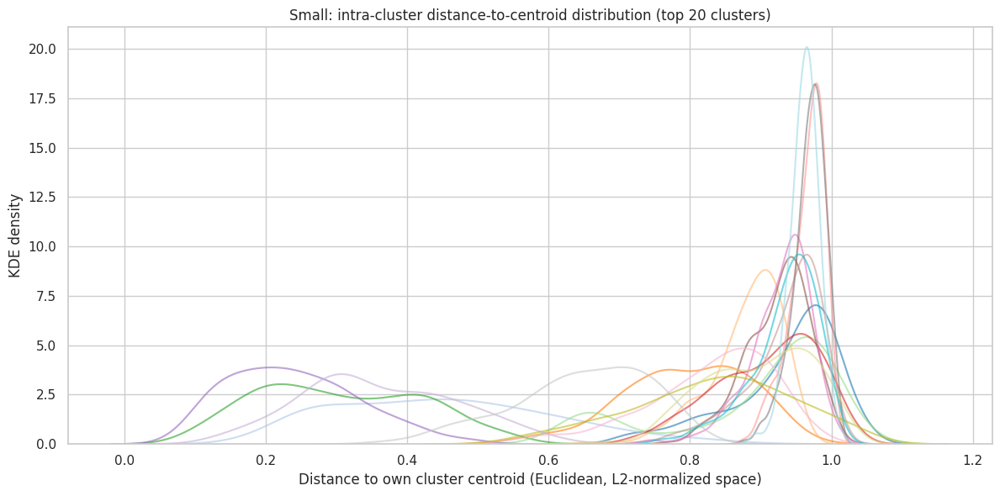

In [49]:
# Plot: per-cluster KDE of distances from each point to its cluster centroid
# NOTE: field `densities` in labels.npz actually stores distance-to-own-centroid
# (Euclidean on L2-normalized vectors). Not probability density.
fig, ax = plt.subplots(figsize=(12, 6))

# For large (18): all clusters; for medium/small: limit to top N for clarity
max_show = min(20, n_clusters_small)
top_cids = np.argsort(-sizes_small)[:max_show]
cmap = plt.cm.tab20(np.linspace(0, 1, max_show))

for i, cid in enumerate(top_cids):
    mask = labels == cid
    sns.kdeplot(densities[mask], ax=ax, color=cmap[i], alpha=0.6, linewidth=1.5,
                label=f"{cid} (n={mask.sum()})" if max_show <= 18 else None)

ax.set_xlabel("Distance to own cluster centroid (Euclidean, L2-normalized space)")
ax.set_ylabel("KDE density")
ax.set_title(f"Small: intra-cluster distance-to-centroid distribution (top {max_show} clusters)", fontsize=12)
if max_show <= 18:
    ax.legend(ncol=3, fontsize=8, loc="upper right", title="cluster (n)")
plt.tight_layout()
plt.savefig(FIG_DIR / "small_03_intra_dist_kde.png")
plt.show()


> *Plot S3*: KDE расстояний от каждой точки до **её собственного центроида**. Узкий пик слева = компактный кластер; широкий/смещённый вправо = рыхлый.

/tmp/ipykernel_813753/4236214689.py:26: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(box_data, labels=box_labels, patch_artist=True, showfliers=False)


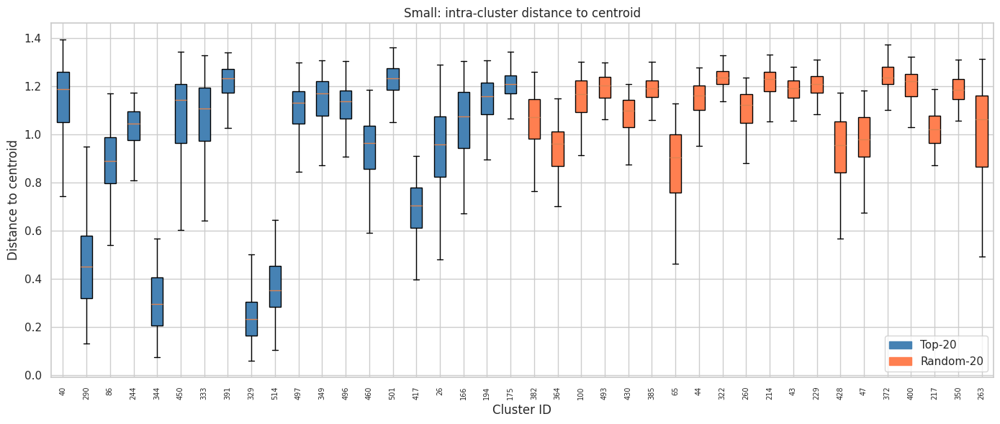

In [50]:
# Plot: boxplot of intra-cluster distance to centroid
fig, ax = plt.subplots(figsize=(14, 6))

# For small: only show selection
if "small" == "small":
    show_cids = SEL_SMALL["combined"]
    sel_groups = SEL_SMALL["group"]
else:
    show_cids = list(range(n_clusters_small))
    sel_groups = None

box_data = []
box_labels = []
box_colors = []
for i, cid in enumerate(show_cids):
    mask = labels == cid
    if mask.any():
        dists = np.linalg.norm(vectors[mask] - centroids[cid], axis=1)
        box_data.append(dists)
        box_labels.append(str(cid))
        if sel_groups is not None:
            box_colors.append("steelblue" if sel_groups[i] == "top" else "coral")
        else:
            box_colors.append("steelblue")

bp = ax.boxplot(box_data, labels=box_labels, patch_artist=True, showfliers=False)
for patch, color in zip(bp["boxes"], box_colors):
    patch.set_facecolor(color)

ax.set_xlabel("Cluster ID")
ax.set_ylabel("Distance to centroid")
ax.set_title(f"Small: intra-cluster distance to centroid")
if sel_groups is not None:
    from matplotlib.patches import Patch
    ax.legend(handles=[Patch(color="steelblue", label="Top-20"), Patch(color="coral", label="Random-20")])
if len(show_cids) > 30:
    plt.xticks(rotation=90, fontsize=7)
plt.tight_layout()
plt.savefig(FIG_DIR / "small_04_intra_dist_boxplot.png")
plt.show()


> *Plot S4*: компактность кластеров — распределение расстояний точек до центроида.

### 3.3 Качество кластеризации

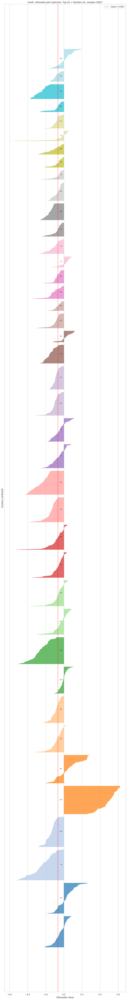

In [51]:
# Silhouette plot (horizontal bars per point, grouped by cluster)
fig, ax = plt.subplots(figsize=(10, max(6, n_clusters_small * 0.15)))

# For small, limit to selection for readability
if "small" == "small":
    sel_cids = SEL_SMALL["combined"]
    mask_sel = np.isin(sample_labels_small, sel_cids)
    ss = sil_scores_small[mask_sel]
    sl = sample_labels_small[mask_sel]
    show_cids = sel_cids
    ax.set_title(f"Small: silhouette plot (selection: Top-20 + Random-20, sample={mask_sel.sum()})")
else:
    ss = sil_scores_small
    sl = sample_labels_small
    show_cids = list(range(n_clusters_small))
    ax.set_title(f"Small: silhouette plot (sample n={len(ss)})")

y_lower = 0
cmap = plt.cm.tab20(np.linspace(0, 1, len(show_cids)))
for i, cid in enumerate(show_cids):
    cluster_ss = np.sort(ss[sl == cid])
    if len(cluster_ss) == 0:
        continue
    y_upper = y_lower + len(cluster_ss)
    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_ss,
                     facecolor=cmap[i], edgecolor=cmap[i], alpha=0.7)
    ax.text(-0.02, y_lower + len(cluster_ss) / 2, str(cid), fontsize=7, ha="right", va="center")
    y_lower = y_upper + 5

ax.axvline(sil_mean_small, color="red", linestyle="--", label=f"mean={sil_mean_small:.3f}")
ax.set_xlabel("Silhouette value")
ax.set_ylabel("Clusters (ordered)")
ax.legend()
ax.set_yticks([])
plt.tight_layout()
plt.savefig(FIG_DIR / "small_05_silhouette_plot.png")
plt.show()


> *Plot S5*: классический silhouette plot — ширина полосы = silhouette score каждой точки.

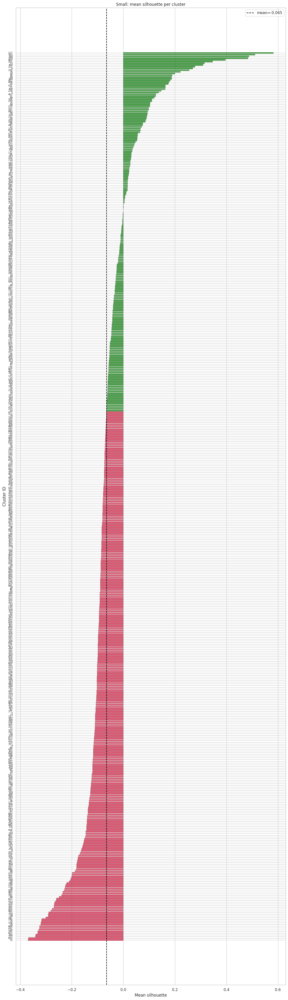

In [52]:
# Bar chart: mean silhouette per cluster
fig, ax = plt.subplots(figsize=(12, max(5, n_clusters_small * 0.08)))

cids = sorted(per_cluster_sil_small.keys())
vals = [per_cluster_sil_small[c] for c in cids]
order = np.argsort(vals)
cids_sorted = [cids[i] for i in order]
vals_sorted = [vals[i] for i in order]

colors = ["green" if v > sil_mean_small else "crimson" for v in vals_sorted]
ax.barh(range(len(cids_sorted)), vals_sorted, color=colors, alpha=0.7, edgecolor="black", linewidth=0.3)
ax.axvline(sil_mean_small, color="black", linestyle="--", label=f"mean={sil_mean_small:.3f}")
ax.set_yticks(range(len(cids_sorted)))
ax.set_yticklabels(cids_sorted, fontsize=7 if n_clusters_small > 50 else 9)
ax.set_xlabel("Mean silhouette")
ax.set_ylabel("Cluster ID")
ax.set_title(f"Small: mean silhouette per cluster")
ax.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "small_06_silhouette_per_cluster.png")
plt.show()


> *Plot S6*: средний silhouette каждого кластера. Красные — ниже среднего.

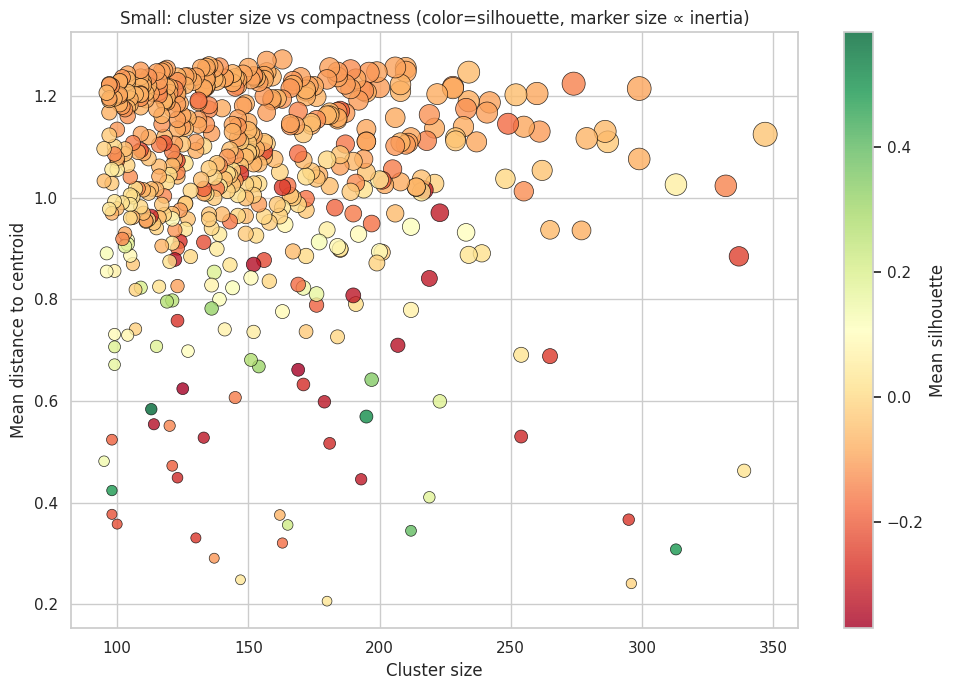

In [53]:
# Scatter: size vs mean intra-distance, color=silhouette, marker size ∝ inertia
fig, ax = plt.subplots(figsize=(10, 7))
df_plot = summary_small.copy()
sizes_s = df_plot["size"].values
mean_dists = df_plot["mean_dist"].values
sils = df_plot["silhouette"].values
inertias = df_plot["inertia"].values

marker_sizes = 50 + 250 * (inertias - inertias.min()) / (inertias.max() - inertias.min() + 1e-9)
sc = ax.scatter(sizes_s, mean_dists, c=sils, s=marker_sizes,
                cmap="RdYlGn", alpha=0.8, edgecolor="black", linewidth=0.5)
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Mean silhouette")
ax.set_xlabel("Cluster size")
ax.set_ylabel("Mean distance to centroid")
ax.set_title(f"Small: cluster size vs compactness (color=silhouette, marker size ∝ inertia)")
if "small" == "large":
    for cid, row in df_plot.iterrows():
        ax.annotate(str(cid), (row["size"], row["mean_dist"]), fontsize=8)
plt.tight_layout()
plt.savefig(FIG_DIR / "small_07_size_vs_compactness.png")
plt.show()


> *Plot S7*: зависимость компактности от размера кластера.

### 3.4 Межкластерная структура

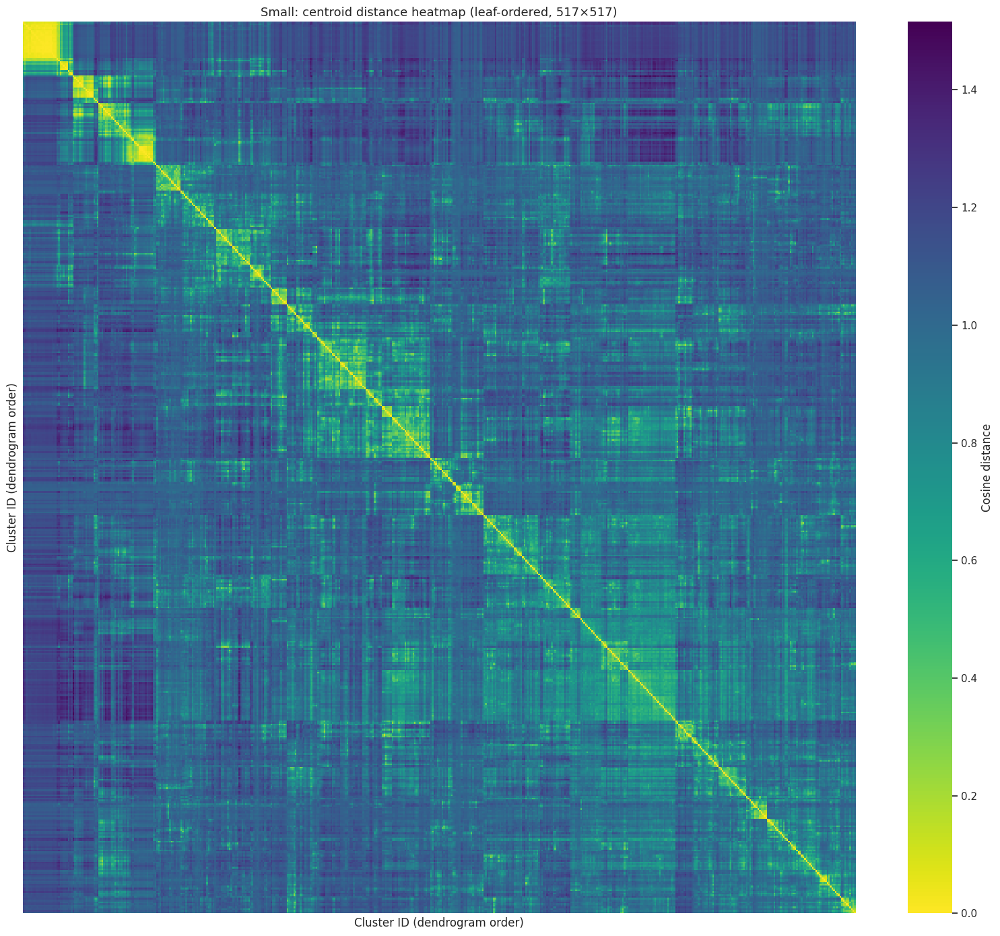

In [54]:
# Heatmap of centroid cosine distances, ordered by hierarchical clustering
dist_mat = H.centroid_distance_matrix(centroids, metric="cosine")
Z = sch.linkage(squareform(dist_mat, checks=False), method="average")
leaves = sch.leaves_list(Z)
dist_mat_ord = dist_mat[leaves][:, leaves]

fig, ax = plt.subplots(figsize=(max(12, min(n_clusters_small * 0.12, 16)), max(10, min(n_clusters_small * 0.11, 14))))
sns.heatmap(dist_mat_ord,
            annot=(n_clusters_small <= 20),
            fmt=".2f",
            cmap="viridis_r",
            xticklabels=leaves if n_clusters_small <= 100 else False,
            yticklabels=leaves if n_clusters_small <= 100 else False,
            ax=ax, cbar_kws={"label": "Cosine distance"})
ax.set_title(f"Small: centroid distance heatmap (leaf-ordered, {n_clusters_small}×{n_clusters_small})", fontsize=13)
ax.set_xlabel("Cluster ID (dendrogram order)")
ax.set_ylabel("Cluster ID (dendrogram order)")
plt.tight_layout()
plt.savefig(FIG_DIR / "small_08_centroid_heatmap.png")
plt.show()


> *Plot S8*: матрица косинусных расстояний между центроидами.

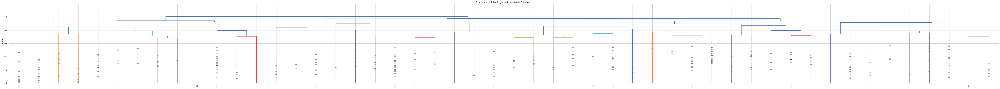

In [55]:
# Dendrogram of centroids
fig, ax = plt.subplots(figsize=(max(14, n_clusters_small * 0.15), 7))
labels_dendro = [f"{cid}: {'/'.join(ANCHORS['small'].get(cid, [])[:2])}" for cid in range(n_clusters_small)]

# For small, truncate
if n_clusters_small > 100:
    sch.dendrogram(Z, ax=ax, truncate_mode="lastp", p=50, leaf_font_size=8,
                   show_contracted=True)
    ax.set_title(f"Small: centroid dendrogram (truncated to 50 leaves)")
else:
    sch.dendrogram(Z, ax=ax, labels=labels_dendro, leaf_font_size=8 if n_clusters_small <= 20 else 6,
                   leaf_rotation=90)
    ax.set_title(f"Small: centroid dendrogram (average linkage, cosine)")

ax.set_ylabel("Distance")
plt.tight_layout()
plt.savefig(FIG_DIR / "small_09_dendrogram.png")
plt.show()


> *Plot S9*: иерархия кластеров (average linkage) с anchor-словами в листах.

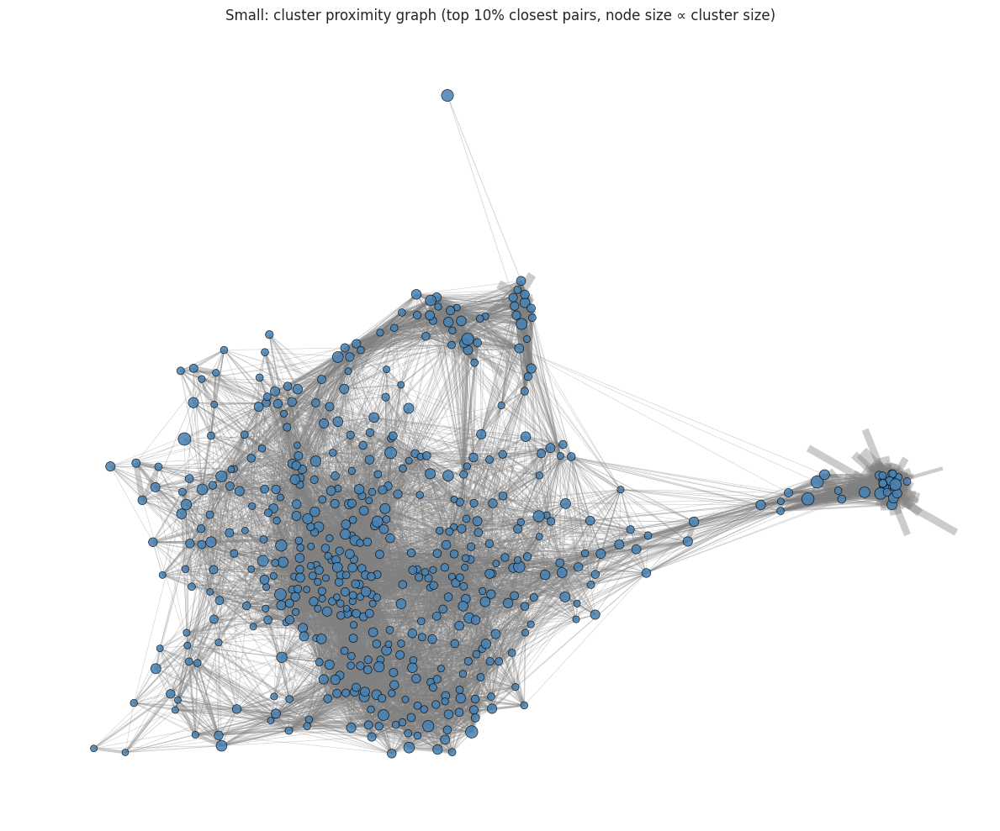

In [56]:
# Force-directed graph of closest centroid pairs
import networkx as nx
n_edges_show = int(n_clusters_small * (n_clusters_small - 1) / 2 * 0.10)  # top 10%
mask_tri = np.triu(np.ones_like(dist_mat, dtype=bool), k=1)
pairs = [(i, j, dist_mat[i, j]) for i, j in zip(*np.where(mask_tri))]
pairs.sort(key=lambda x: x[2])
top_pairs = pairs[:max(n_edges_show, n_clusters_small)]

G = nx.Graph()
for i in range(n_clusters_small):
    G.add_node(i, size=int(sizes_small[i]))
for i, j, d in top_pairs:
    G.add_edge(int(i), int(j), weight=1.0 / (d + 1e-6))

pos = nx.spring_layout(G, seed=42, k=0.8)
fig, ax = plt.subplots(figsize=(12, 10))
node_sizes = [G.nodes[n]["size"] / 3 for n in G.nodes]
edge_widths = [G.edges[e]["weight"] * 0.3 for e in G.edges]
nx.draw_networkx_edges(G, pos, ax=ax, width=edge_widths, alpha=0.4, edge_color="gray")
nx.draw_networkx_nodes(G, pos, ax=ax, node_size=node_sizes, node_color="steelblue",
                        edgecolors="black", linewidths=0.5, alpha=0.85)
if n_clusters_small <= 100:
    nx.draw_networkx_labels(G, pos, ax=ax, font_size=7)
ax.set_title(f"Small: cluster proximity graph (top 10% closest pairs, node size ∝ cluster size)")
ax.axis("off")
plt.tight_layout()
plt.savefig(FIG_DIR / "small_10_network.png")
plt.show()


> *Plot S10*: граф близости — связи между семантически близкими кластерами.

### 3.5 2D проекция UMAP

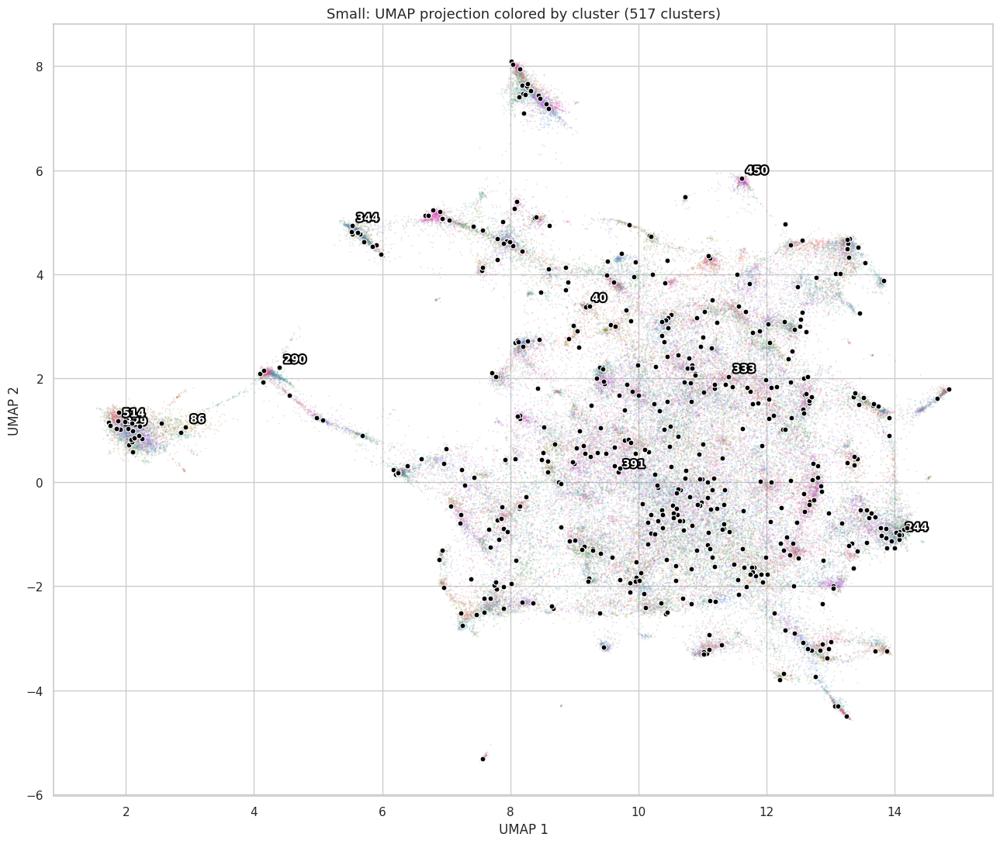

In [57]:
# UMAP scatter colored by cluster
fig, ax = plt.subplots(figsize=(13, 11))
k = n_clusters_small

if k <= 20:
    palette = plt.cm.tab20(np.linspace(0, 1, k))
elif k <= 100:
    palette = sns.husl_palette(k, l=0.65, s=0.85)
else:
    palette = sns.husl_palette(k, l=0.6, s=0.85)

# Point rendering
point_alpha = 0.35 if k <= 20 else (0.3 if k <= 100 else 0.22)
point_size = 4 if k <= 20 else (2.5 if k <= 100 else 2)

for cid in range(k):
    mask = labels == cid
    color = palette[cid]
    ax.scatter(umap_coords[mask, 0], umap_coords[mask, 1],
               c=[color], s=point_size, alpha=point_alpha, linewidth=0)

# Centroids and labels
cent_2d = CENTROIDS_2D["small"]

if k <= 20:
    # All centroids labeled with big text
    ax.scatter(cent_2d[:, 0], cent_2d[:, 1], c="white", s=380, marker="o",
               edgecolors="black", linewidths=2, zorder=10)
    for i in range(k):
        ax.text(cent_2d[i, 0], cent_2d[i, 1], str(i), fontsize=13, fontweight="bold",
                ha="center", va="center", color="black", zorder=11)
else:
    # For 100/517: small centroid dots, label only top 10
    ax.scatter(cent_2d[:, 0], cent_2d[:, 1], c="black", s=25, marker="o",
               edgecolors="white", linewidths=0.8, zorder=10)
    top10 = np.argsort(-sizes_small)[:10]
    for i in top10:
        ax.annotate(f"{i}", cent_2d[i], fontsize=10, fontweight="bold",
                    color="white",
                    xytext=(4, 4), textcoords="offset points",
                    path_effects=[
                        __import__("matplotlib.patheffects", fromlist=["withStroke"]).withStroke(
                            linewidth=3, foreground="black")
                    ])

ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.set_title(f"Small: UMAP projection colored by cluster ({k} clusters)", fontsize=13)
plt.tight_layout()
plt.savefig(FIG_DIR / "small_11_umap_clusters.png")
plt.show()


> *Plot S11*: UMAP-проекция с цветовой кодировкой кластеров и центроидами.

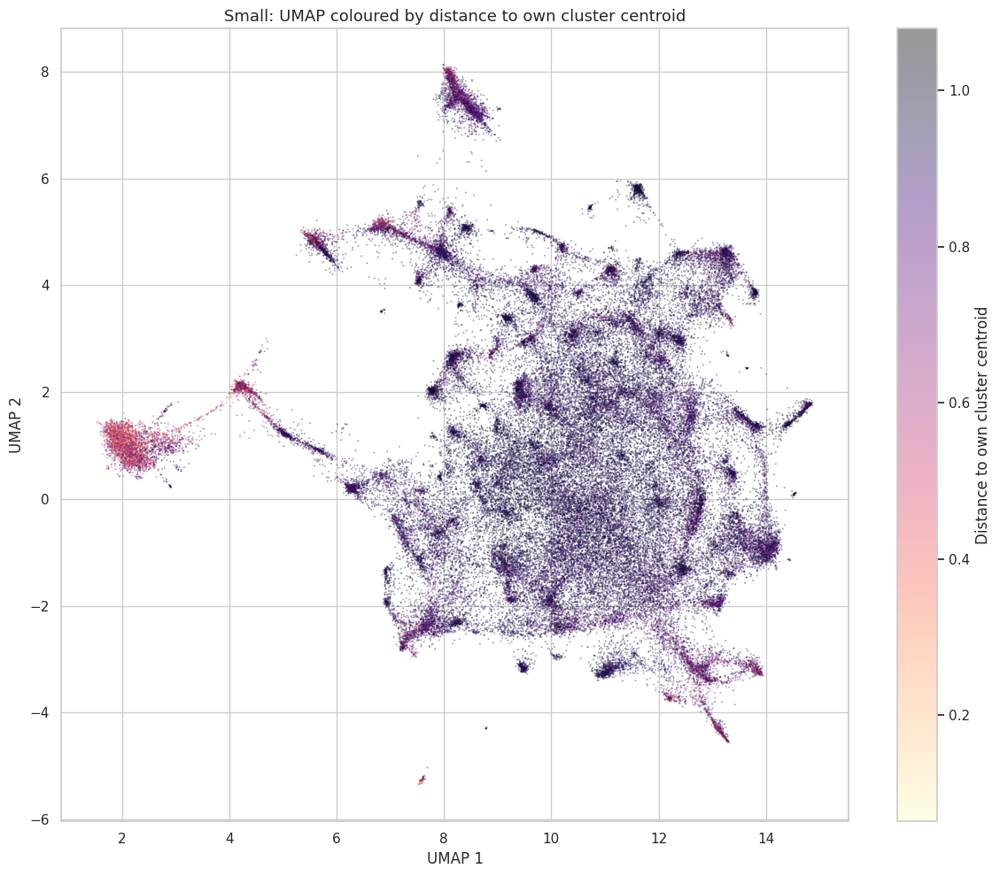

In [58]:
# UMAP colored by per-point distance-to-own-centroid
# (field `densities` in labels.npz = Euclidean distance to own cluster centroid)
fig, ax = plt.subplots(figsize=(12, 10))
sc = ax.scatter(umap_coords[:, 0], umap_coords[:, 1],
                c=densities, s=2, alpha=0.4, cmap="magma_r", linewidth=0)
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Distance to own cluster centroid")
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.set_title(f"Small: UMAP coloured by distance to own cluster centroid", fontsize=13)
plt.tight_layout()
plt.savefig(FIG_DIR / "small_12_umap_dist_to_centroid.png")
plt.show()


> *Plot S12*: UMAP, раскраска по расстоянию **до собственного центроида кластера**. Тёмные точки = близко к центру своего кластера (ядро); светлые = на периферии, далеко от центра. Помогает увидеть «размытые» или «плотные» кластеры в пространстве.

## 4. Cross-level hierarchy

### 4.1 Flow matrices и purity

In [59]:
# Build flow matrices between levels
labels_L = LEVELS["large"]["labels"]
labels_M = LEVELS["medium"]["labels"]
labels_S = LEVELS["small"]["labels"]
k_L = LEVELS["large"]["n_clusters"]
k_M = LEVELS["medium"]["n_clusters"]
k_S = LEVELS["small"]["n_clusters"]

flow_LM = H.build_flow_matrix(labels_L, labels_M, k_L, k_M)
flow_MS = H.build_flow_matrix(labels_M, labels_S, k_M, k_S)
flow_LS = H.build_flow_matrix(labels_L, labels_S, k_L, k_S)

# Sanity: row sums = cluster sizes
assert flow_LM.sum(axis=1).tolist() == np.bincount(labels_L).tolist(), "row sum mismatch"
print(f"flow_LM shape: {flow_LM.shape}, total: {flow_LM.sum()}")
print(f"flow_MS shape: {flow_MS.shape}, total: {flow_MS.sum()}")
print(f"flow_LS shape: {flow_LS.shape}, total: {flow_LS.sum()}")


flow_LM shape: (18, 100), total: 79485
flow_MS shape: (100, 517), total: 79485
flow_LS shape: (18, 517), total: 79485


In [60]:
# Purity: how cleanly Medium nests into Large, Small into Medium
purity_M_in_L = H.purity_from_flow(flow_LM, axis=0)  # per Medium column
purity_S_in_M = H.purity_from_flow(flow_MS, axis=0)  # per Small column
purity_S_in_L = H.purity_from_flow(flow_LS, axis=0)

print(f"Medium clusters: mean purity in Large = {purity_M_in_L.mean():.3f}, "
      f"median = {np.median(purity_M_in_L):.3f}")
print(f"  >0.9 pure: {(purity_M_in_L > 0.9).sum()}/{k_M}")
print(f"  >0.95 pure: {(purity_M_in_L > 0.95).sum()}/{k_M}")

print(f"Small clusters: mean purity in Medium = {purity_S_in_M.mean():.3f}, "
      f"median = {np.median(purity_S_in_M):.3f}")
print(f"  >0.9 pure: {(purity_S_in_M > 0.9).sum()}/{k_S}")

print(f"Small clusters: mean purity in Large = {purity_S_in_L.mean():.3f}")


Medium clusters: mean purity in Large = 1.000, median = 1.000
  >0.9 pure: 100/100
  >0.95 pure: 100/100
Small clusters: mean purity in Medium = 0.978, median = 1.000
  >0.9 pure: 484/517
Small clusters: mean purity in Large = 0.983


### 4.2 Визуализация flow между уровнями

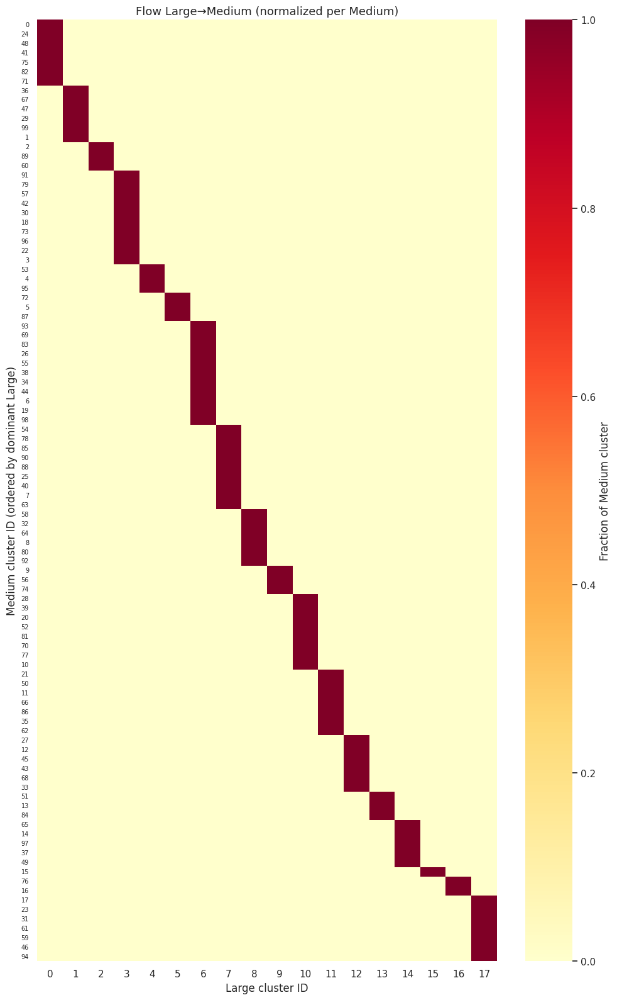

In [61]:
# Heatmap flow_LM — how Medium clusters distribute over Large
import matplotlib.colors as mcolors

# Normalize per Medium column: fraction of Medium cluster coming from each Large
flow_LM_norm = flow_LM / (flow_LM.sum(axis=0, keepdims=True) + 1e-9)

# Order Medium columns so dominant Large alternates along x (visual)
dominant_L = flow_LM_norm.argmax(axis=0)
col_order = np.argsort(dominant_L)

# Transpose for better aspect ratio (100 rows × 18 cols)
fig, ax = plt.subplots(figsize=(10, 16))
sns.heatmap(flow_LM_norm[:, col_order].T,
            cmap="YlOrRd", vmin=0, vmax=1,
            xticklabels=range(k_L), yticklabels=col_order,
            ax=ax, cbar_kws={"label": "Fraction of Medium cluster"})
ax.set_ylabel("Medium cluster ID (ordered by dominant Large)")
ax.set_xlabel("Large cluster ID")
ax.set_title("Flow Large→Medium (normalized per Medium)", fontsize=13)
plt.setp(ax.get_yticklabels(), fontsize=7)
plt.tight_layout()
plt.savefig(FIG_DIR / "cross_01_flow_LM.png")
plt.show()


> *Plot X1*: каждый столбец = один Medium-кластер. Тёплые ячейки показывают, из каких Large он состоит. Большинство Medium ∈ ровно один Large = хорошая иерархия.

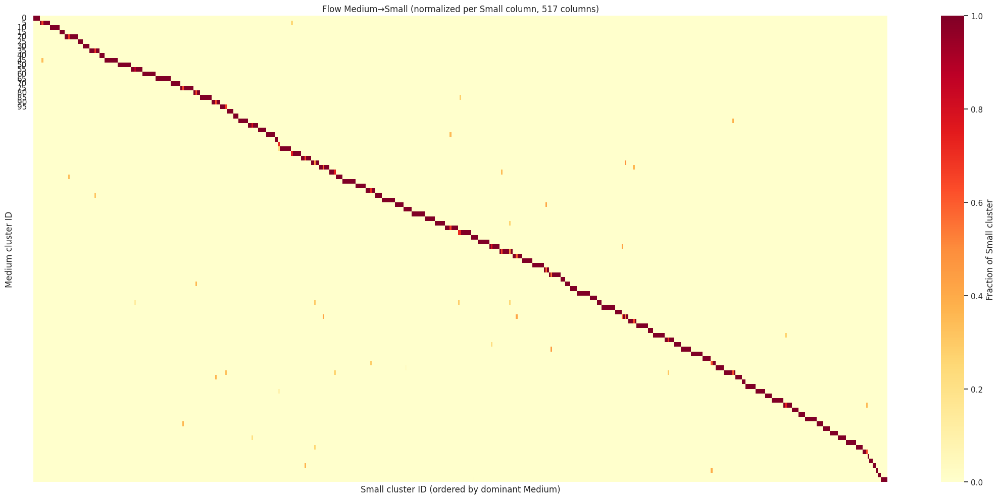

In [62]:
# Heatmap flow_MS (100x517)
flow_MS_norm = flow_MS / (flow_MS.sum(axis=0, keepdims=True) + 1e-9)
dominant_M = flow_MS_norm.argmax(axis=0)
col_order_S = np.argsort(dominant_M)

fig, ax = plt.subplots(figsize=(22, 10))
sns.heatmap(flow_MS_norm[:, col_order_S],
            cmap="YlOrRd", vmin=0, vmax=1,
            xticklabels=False, yticklabels=range(0, k_M, 5),
            ax=ax, cbar_kws={"label": "Fraction of Small cluster"})
ax.set_xlabel("Small cluster ID (ordered by dominant Medium)")
ax.set_ylabel("Medium cluster ID")
ax.set_title("Flow Medium→Small (normalized per Small column, 517 columns)")
plt.tight_layout()
plt.savefig(FIG_DIR / "cross_02_flow_MS.png")
plt.show()


> *Plot X2*: вложенность Small → Medium. Диагональная структура = каждый Small целиком принадлежит одному Medium.

In [63]:
# Plotly Sankey: Large -> Medium -> Small
import plotly.graph_objects as go
import plotly.io as pio

# Filter flows below threshold to reduce visual clutter
threshold_LM = 30
threshold_MS = 20

# Build node list: 0..k_L-1 = Large, k_L..k_L+k_M-1 = Medium, then Small
node_labels = []
node_colors = []

# Color palette for Large clusters
L_colors = [f"hsl({h},70%,50%)" for h in np.linspace(0, 340, k_L)]

for i in range(k_L):
    top_w = ANCHORS["large"].get(i, ["?"])[0]
    node_labels.append(f"L{i}: {top_w}")
    node_colors.append(L_colors[i])

# Propagate Large color to Medium and Small based on dominant source
for j in range(k_M):
    dominant = flow_LM[:, j].argmax()
    node_labels.append(f"M{j}")
    node_colors.append(L_colors[dominant])

for kk in range(k_S):
    dominant_M_for_S = flow_MS[:, kk].argmax()
    dominant_L_for_S = flow_LM[:, dominant_M_for_S].argmax()
    node_labels.append(f"S{kk}")
    node_colors.append(L_colors[dominant_L_for_S])

# Build links
sources, targets, values, link_colors = [], [], [], []
for i in range(k_L):
    for j in range(k_M):
        if flow_LM[i, j] >= threshold_LM:
            sources.append(i)
            targets.append(k_L + j)
            values.append(int(flow_LM[i, j]))
            link_colors.append(L_colors[i].replace("50%)", "50%,0.4)").replace("hsl", "hsla"))

for j in range(k_M):
    for kk in range(k_S):
        if flow_MS[j, kk] >= threshold_MS:
            sources.append(k_L + j)
            targets.append(k_L + k_M + kk)
            values.append(int(flow_MS[j, kk]))
            dom = flow_LM[:, j].argmax()
            link_colors.append(L_colors[dom].replace("50%)", "50%,0.3)").replace("hsl", "hsla"))

total = flow_LM.sum() + flow_MS.sum()
kept = sum(values)
print(f"Links kept: {len(sources)}, value total: {kept} ({100*kept/total:.1f}% of flows)")

fig = go.Figure(data=[go.Sankey(
    node=dict(pad=10, thickness=15, line=dict(color="black", width=0.3),
              label=node_labels, color=node_colors),
    link=dict(source=sources, target=targets, value=values, color=link_colors),
)])
fig.update_layout(title_text="Cross-level hierarchy: Large → Medium → Small",
                  font_size=9, height=900, width=1400)
fig.write_html(FIG_DIR / "cross_03_sankey.html")
try:
    fig.write_image(FIG_DIR / "cross_03_sankey.png", scale=1.5)
except Exception as e:
    print(f"[warn] PNG export failed: {e}")
fig.show()


Links kept: 653, value total: 158966 (100.0% of flows)


> *Plot X3 (Sankey)*: потоки слов через уровни Large → Medium → Small. Цвет наследуется от Large-источника.

In [64]:
# Plotly Treemap: hierarchical Large > Medium > Small
import plotly.express as px

# Build hierarchical dataframe
tree_rows = []
for i in range(k_L):
    L_label = f"L{i}: {ANCHORS['large'].get(i, ['?'])[0]}"
    for j in range(k_M):
        if flow_LM[i, j] == 0:
            continue
        M_label = f"M{j}"
        for kk in range(k_S):
            if flow_MS[j, kk] == 0:
                continue
            # Check if this S is also in L_i (majority rule)
            if flow_LS[i, kk] == 0:
                continue
            S_label = f"S{kk}"
            tree_rows.append({
                "Large": L_label,
                "Medium": M_label,
                "Small": S_label,
                "size": int(flow_LS[i, kk]),
            })

tree_df = pd.DataFrame(tree_rows)
print(f"Treemap rows: {len(tree_df)}")

fig = px.treemap(tree_df, path=["Large", "Medium", "Small"], values="size",
                 color="size", color_continuous_scale="Viridis",
                 title="Hierarchical treemap: Large ⊃ Medium ⊃ Small")
fig.update_layout(height=800, width=1400)
fig.write_html(FIG_DIR / "cross_04_treemap.html")
try:
    fig.write_image(FIG_DIR / "cross_04_treemap.png", scale=1.5)
except Exception as e:
    print(f"[warn] PNG export failed: {e}")
fig.show()


Treemap rows: 555


> *Plot X4 (Treemap)*: вложенная визуализация иерархии с пропорциональными площадями.

In [65]:
# Plotly Sunburst: alternative view
fig = px.sunburst(tree_df, path=["Large", "Medium", "Small"], values="size",
                  color="size", color_continuous_scale="Viridis",
                  title="Sunburst: Large ⊃ Medium ⊃ Small")
fig.update_layout(height=800, width=900)
fig.write_html(FIG_DIR / "cross_05_sunburst.html")
try:
    fig.write_image(FIG_DIR / "cross_05_sunburst.png", scale=1.5)
except Exception as e:
    print(f"[warn] PNG export failed: {e}")
fig.show()


> *Plot X5 (Sunburst)*: круговая альтернатива treemap.

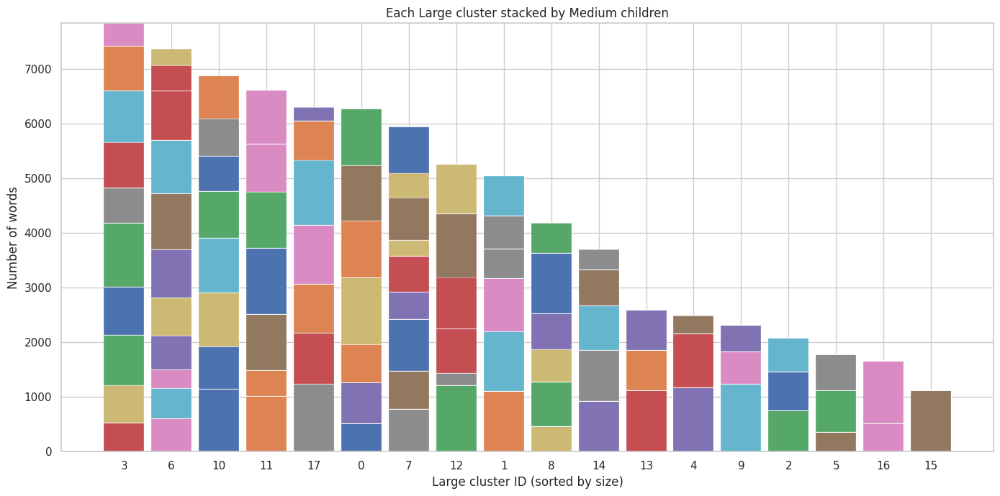

In [66]:
# Stacked bar: for each Large cluster, Medium children
fig, ax = plt.subplots(figsize=(14, 7))

# For each Large, order Medium children by size, use husl colors
large_order = np.argsort(-np.bincount(labels_L))
x_pos = np.arange(k_L)

bottoms = np.zeros(k_L)
for j in range(k_M):
    vals = flow_LM[:, j]
    if vals.sum() == 0:
        continue
    ax.bar(x_pos, vals[large_order], bottom=bottoms[large_order], width=0.85,
           edgecolor="white", linewidth=0.2)
    bottoms[large_order] += vals[large_order]

ax.set_xlabel("Large cluster ID (sorted by size)")
ax.set_ylabel("Number of words")
ax.set_title("Each Large cluster stacked by Medium children")
ax.set_xticks(x_pos)
ax.set_xticklabels(large_order)
plt.tight_layout()
plt.savefig(FIG_DIR / "cross_06_stacked_bar.png")
plt.show()


> *Plot X6*: каждый Large-кластер разбит на Medium-дети — видно, как именно происходит дробление.

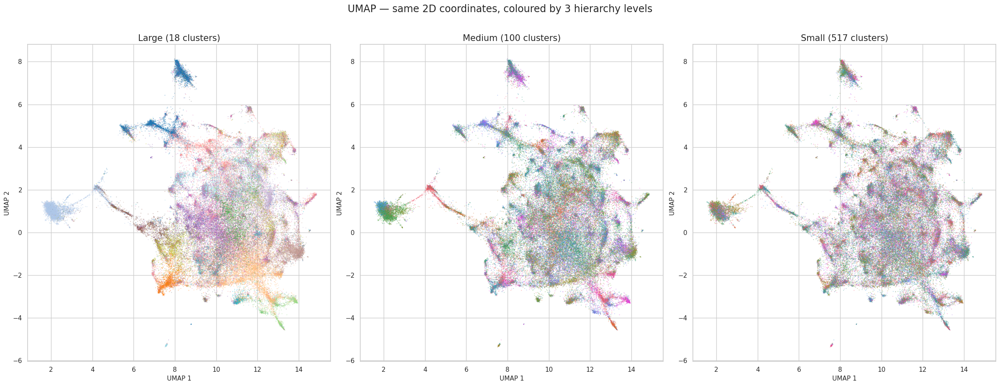

In [67]:
# UMAP triptych: colored by Large / Medium / Small
fig, axes = plt.subplots(1, 3, figsize=(24, 9))

for ax, level_name in zip(axes, ["large", "medium", "small"]):
    lvl = LEVELS[level_name]
    k = lvl["n_clusters"]
    labs = lvl["labels"]
    if k <= 20:
        palette = plt.cm.tab20(np.linspace(0, 1, k))
    else:
        palette = np.array(sns.husl_palette(k, l=0.6, s=0.85))
    colors = palette[labs]
    ax.scatter(umap_coords[:, 0], umap_coords[:, 1], c=colors,
               s=2.5, alpha=0.35, linewidth=0)
    ax.set_title(f"{level_name.title()} ({k} clusters)", fontsize=15)
    ax.set_xlabel("UMAP 1", fontsize=11)
    ax.set_ylabel("UMAP 2", fontsize=11)

plt.suptitle("UMAP — same 2D coordinates, coloured by 3 hierarchy levels", fontsize=17, y=1.02)
plt.tight_layout()
plt.savefig(FIG_DIR / "cross_07_umap_triptych.png")
plt.show()


> *Plot X7*: одни и те же UMAP-координаты, но раскрашенные по трём уровням — видно иерархическую детализацию.

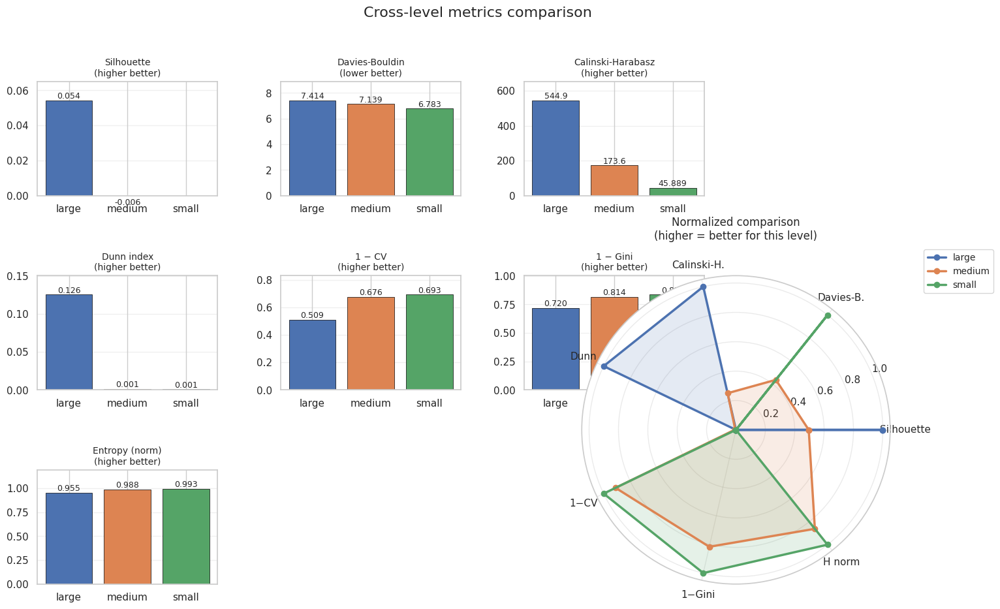

In [68]:
# Grid of individual metric bars + radar chart
from math import pi

metrics_to_compare = {
    "Silhouette\n(higher better)": lambda lvl: QUALITY[lvl]["silhouette"],
    "Davies-Bouldin\n(lower better)": lambda lvl: QUALITY[lvl]["davies_bouldin"],
    "Calinski-Harabasz\n(higher better)": lambda lvl: QUALITY[lvl]["calinski_harabasz"],
    "Dunn index\n(higher better)": lambda lvl: QUALITY[lvl]["dunn"],
    "1 − CV\n(higher better)": lambda lvl: 1 - H.distribution_summary(
        np.bincount(LEVELS[lvl]["labels"][LEVELS[lvl]["labels"] >= 0]))["cv"],
    "1 − Gini\n(higher better)": lambda lvl: 1 - H.distribution_summary(
        np.bincount(LEVELS[lvl]["labels"][LEVELS[lvl]["labels"] >= 0]))["gini"],
    "Entropy (norm)\n(higher better)": lambda lvl: H.distribution_summary(
        np.bincount(LEVELS[lvl]["labels"][LEVELS[lvl]["labels"] >= 0]))["entropy_norm"],
}

level_names = ["large", "medium", "small"]
data = {m: [fn(lvl) for lvl in level_names] for m, fn in metrics_to_compare.items()}
colors_bar = ["#4C72B0", "#DD8452", "#55A467"]

# Create grid: 7 individual bar plots + 1 radar
fig = plt.figure(figsize=(18, 10))
gs = fig.add_gridspec(3, 4, hspace=0.7, wspace=0.35)

# Individual metric bars (one subplot each)
positions = [(0, 0), (0, 1), (0, 2), (1, 0), (1, 1), (1, 2), (2, 0)]
for (r, c), (metric_name, vals_fn) in zip(positions, metrics_to_compare.items()):
    ax = fig.add_subplot(gs[r, c])
    vals = [vals_fn(lvl) for lvl in level_names]
    bars = ax.bar(level_names, vals, color=colors_bar, edgecolor="black", linewidth=0.5)
    ax.set_title(metric_name, fontsize=10)
    for b, v in zip(bars, vals):
        ax.text(b.get_x() + b.get_width() / 2, v, f"{v:.3f}" if abs(v) < 100 else f"{v:.1f}",
                ha="center", va="bottom", fontsize=9)
    ax.grid(axis="y", alpha=0.3)
    ax.set_ylim(0, max(vals) * 1.2 if max(vals) > 0 else 1)

# Radar chart (right side, spans 2x2)
ax_radar = fig.add_subplot(gs[1:3, 2:], projection="polar")

def normalize_for_radar(values, higher_better=True):
    v = np.array(values, dtype=float)
    if v.max() - v.min() < 1e-9:
        return np.ones_like(v) * 0.5
    normed = (v - v.min()) / (v.max() - v.min())
    if not higher_better:
        normed = 1 - normed
    return normed

# For radar, 'lower better' DB needs inversion
radar_metrics = {
    "Silhouette": (lambda lvl: QUALITY[lvl]["silhouette"], True),
    "Davies-B.": (lambda lvl: QUALITY[lvl]["davies_bouldin"], False),
    "Calinski-H.": (lambda lvl: QUALITY[lvl]["calinski_harabasz"], True),
    "Dunn": (lambda lvl: QUALITY[lvl]["dunn"], True),
    "1−CV": (lambda lvl: 1 - H.distribution_summary(
        np.bincount(LEVELS[lvl]["labels"][LEVELS[lvl]["labels"] >= 0]))["cv"], True),
    "1−Gini": (lambda lvl: 1 - H.distribution_summary(
        np.bincount(LEVELS[lvl]["labels"][LEVELS[lvl]["labels"] >= 0]))["gini"], True),
    "H norm": (lambda lvl: H.distribution_summary(
        np.bincount(LEVELS[lvl]["labels"][LEVELS[lvl]["labels"] >= 0]))["entropy_norm"], True),
}

labels_radar = list(radar_metrics.keys())
N = len(labels_radar)
angles = [n / N * 2 * pi for n in range(N)]
angles += angles[:1]

normed_vals = {}
for mname, (fn, higher) in radar_metrics.items():
    raw = [fn(lvl) for lvl in level_names]
    normed_vals[mname] = normalize_for_radar(raw, higher_better=higher)

for i, lvl in enumerate(level_names):
    values = [normed_vals[m][i] for m in labels_radar]
    values += values[:1]
    ax_radar.plot(angles, values, "o-", linewidth=2.5, label=lvl, color=colors_bar[i])
    ax_radar.fill(angles, values, alpha=0.15, color=colors_bar[i])

ax_radar.set_xticks(angles[:-1])
ax_radar.set_xticklabels(labels_radar, fontsize=11)
ax_radar.set_ylim(0, 1.05)
ax_radar.set_title("Normalized comparison\n(higher = better for this level)", fontsize=12, y=1.10)
ax_radar.legend(loc="upper right", bbox_to_anchor=(1.35, 1.1), fontsize=10)
ax_radar.grid(True, alpha=0.4)

plt.suptitle("Cross-level metrics comparison", fontsize=16, y=0.995)
plt.savefig(FIG_DIR / "cross_08_metrics_comparison.png", bbox_inches="tight")
plt.show()


> *Plot X8*: многомерное сравнение метрик качества между уровнями.

## 5. Summary

In [69]:
# Consolidated metrics table
summary_rows = []
for name in ["large", "medium", "small"]:
    lvl = LEVELS[name]
    sizes = np.bincount(lvl["labels"][lvl["labels"] >= 0])
    dist = H.distribution_summary(sizes)
    # Quality metrics were stored in global QUALITY dict
    q = QUALITY[name]
    summary_rows.append({
        "level": name,
        "n_clusters": dist["n_clusters"],
        "min": dist["min"],
        "max": dist["max"],
        "mean": round(dist["mean"], 1),
        "std": round(dist["std"], 1),
        "CV": round(dist["cv"], 3),
        "max/min": round(dist["max_min_ratio"], 2),
        "Gini": round(dist["gini"], 3),
        "H_norm": round(dist["entropy_norm"], 3),
        "silhouette": round(q["silhouette"], 4),
        "DB": round(q["davies_bouldin"], 3),
        "CH": round(q["calinski_harabasz"], 1),
        "Dunn": round(q["dunn"], 4),
    })

summary_df = pd.DataFrame(summary_rows).set_index("level")
summary_df


,n_clusters,min,max,mean,std,CV,max/min,Gini,H_norm,silhouette,DB,CH,Dunn
level,,,,,,,,,,,,,
large,18,1119,7839,4415.8,2168.3,0.491,7.01,0.280,0.955,0.0542,7.414,544.9,0.1257
medium,100,223,1243,794.9,257.4,0.324,5.57,0.186,0.988,-0.0061,7.139,173.6,0.0014
small,517,95,347,153.7,47.2,0.307,3.65,0.164,0.993,-0.0654,6.783,45.9,0.0007


### Артефакты

- Notebook: `cluster_explore.ipynb`
- Helpers: `helpers.py`
- Figures: `figures/*.png`
- Cache: `cache/umap_coords.npy`, `cache/centroids_*.npy`
- Interactive HTML: `figures/sankey.html`, `figures/treemap.html`, `figures/sunburst.html`
- Report: `claude-report.md`
- Iterations log: `versions/iterations.md`
